In [26]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set(style='whitegrid')
import matplotlib.pyplot as plt

In [2]:
weather=pd.read_csv(r"processed data\weather.csv")
cov_demo=pd.read_csv(r"processed data\covid_and_demographics.csv")
anthro=pd.read_csv(r"processed data\anthropogenic_effects.csv")
hcho=pd.read_csv(r"processed data\temp\all_fomaldehyde.csv")

In [3]:
print(weather.shape)
weather.columns

(12782, 12)


Index(['NAME', 'LATITUDE', 'LONGITUDE', 'ELEVATION',
       'Sea Proximity (approximate-km)', 'Sea Proximity Categorised',
       'Climate Zone', 'DATE', 'PRCP', 'TAVG', 'TMAX', 'TMIN'],
      dtype='object')

In [4]:
print(cov_demo.shape)
cov_demo.columns

(12782, 8)


Index(['District', 'Area(km^2)', 'Population', 'Population_density', 'date',
       'total', 'new', 'Lockdown'],
      dtype='object')

In [5]:
print(anthro.shape)
anthro.columns

(12782, 5)


Index(['region', 'DATE', 'carbonmonoxide_average', 'nitrogendioxide_average',
       'ozone_average'],
      dtype='object')

In [6]:
print(hcho.shape)
hcho.columns

(12782, 4)


Index(['Current_Date', 'Location', 'Next_Date', 'HCHO_reading'], dtype='object')

In [7]:
merged_df = pd.merge(hcho, weather, left_on=['Current_Date', 'Location'], right_on=['DATE', 'NAME'], how='inner')
merged_df = merged_df.drop(['DATE', 'NAME'], axis=1)
merged_df = pd.merge(merged_df, cov_demo, left_on=['Current_Date', 'Location'], right_on=['date', 'District'], how='inner')
merged_df = merged_df.drop(['date', 'District'], axis=1)
merged_df = pd.merge(merged_df, anthro, left_on=['Current_Date', 'Location'], right_on=['DATE', 'region'], how='inner')
merged_df = merged_df.drop(['DATE', 'region'], axis=1)
merged_df=merged_df.sort_values(by=['Location', 'Current_Date'])

In [8]:
merged_df.columns

Index(['Current_Date', 'Location', 'Next_Date', 'HCHO_reading', 'LATITUDE',
       'LONGITUDE', 'ELEVATION', 'Sea Proximity (approximate-km)',
       'Sea Proximity Categorised', 'Climate Zone', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Area(km^2)', 'Population', 'Population_density', 'total',
       'new', 'Lockdown', 'carbonmonoxide_average', 'nitrogendioxide_average',
       'ozone_average'],
      dtype='object')

In [9]:
try:
    # Convert 'Current_Date' to DateTime format
    merged_df['Next_Date'] = pd.to_datetime(merged_df['Next_Date'])
    print("Conversion to DateTime format successful.")
except ValueError as e:
    print(f"Error converting to DateTime format: {e}")

Conversion to DateTime format successful.


In [10]:
try:
    # Convert 'Current_Date' to DateTime format
    merged_df['Current_Date'] = pd.to_datetime(merged_df['Current_Date'])
    print("Conversion to DateTime format successful.")
except ValueError as e:
    print(f"Error converting to DateTime format: {e}")

Conversion to DateTime format successful.


In [11]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12782 entries, 0 to 12781
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   Current_Date                    12782 non-null  datetime64[ns]
 1   Location                        12782 non-null  object        
 2   Next_Date                       12782 non-null  datetime64[ns]
 3   HCHO_reading                    12782 non-null  float64       
 4   LATITUDE                        12782 non-null  float64       
 5   LONGITUDE                       12782 non-null  float64       
 6   ELEVATION                       12782 non-null  float64       
 7   Sea Proximity (approximate-km)  12782 non-null  int64         
 8   Sea Proximity Categorised       12782 non-null  object        
 9   Climate Zone                    12782 non-null  object        
 10  PRCP                            12782 non-null  float64       
 11  TA

In [12]:
# merged_df.to_csv(r"processed data\all_data_combined.csv",index=False)

In [13]:
# from sklearn.preprocessing import LabelEncoder
# # Initialize the LabelEncoder
# label_encoder = LabelEncoder()

# # Apply LabelEncoder to the categorical column(s)
# merged_df['Location_encoded'] = label_encoder.fit_transform(merged_df['Location'])
# merged_df['Sea_Proximity_Categorised_encoded'] = label_encoder.fit_transform(merged_df['Sea Proximity Categorised'])
# merged_df['Climate_Zone_encoded'] = label_encoder.fit_transform(merged_df['Climate Zone'])
# df=merged_df.drop(columns=['Location', 'Sea Proximity Categorised', 'Climate Zone'])
# df.info()

In [14]:
merged_df['Location'].value_counts()

Location
Bibile, Monaragala     1826
Colombo Proper         1826
Deniyaya, Matara       1826
Jaffna Proper          1826
Kandy Proper           1826
Kurunegala Proper      1826
Nuwara Eliya Proper    1826
Name: count, dtype: int64

In [36]:
merged_df

,Current_Date,Location,Next_Date,HCHO_reading,LATITUDE,LONGITUDE,ELEVATION,Sea Proximity (approximate-km),Sea Proximity Categorised,Climate Zone,...,TMIN,Area(km^2),Population,Population_density,total,new,Lockdown,carbonmonoxide_average,nitrogendioxide_average,ozone_average
0,2019-01-01,"Bibile, Monaragala",2019-01-02,0.000019,6.8719,81.3489,151.0,52,Inland,Dry Zone,...,18.60,5638.7,496000,87.963538,0.0,0.0,0,0.035565,0.000007,0.113006
1,2019-01-02,"Bibile, Monaragala",2019-01-03,0.000019,6.8719,81.3489,151.0,52,Inland,Dry Zone,...,17.52,5638.7,496000,87.963538,0.0,0.0,0,0.032648,0.000011,0.113006
2,2019-01-03,"Bibile, Monaragala",2019-01-04,0.000028,6.8719,81.3489,151.0,52,Inland,Dry Zone,...,17.05,5638.7,496000,87.963538,0.0,0.0,0,0.032855,0.000010,0.110589
3,2019-01-04,"Bibile, Monaragala",2019-01-05,0.000037,6.8719,81.3489,151.0,52,Inland,Dry Zone,...,16.77,5638.7,496000,87.963538,0.0,0.0,0,0.033473,0.000009,0.113011
4,2019-01-05,"Bibile, Monaragala",2019-01-06,-0.000018,6.8719,81.3489,151.0,52,Inland,Dry Zone,...,17.82,5638.7,496000,87.963538,0.0,0.0,0,0.034100,0.000009,0.112202
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12777,2023-12-27,Nuwara Eliya Proper,2023-12-28,0.000237,6.9670,80.7670,1880.0,99,Hill Country,Intermediate Zone,...,59.00,1741.2,781000,448.541236,672039.0,0.0,0,0.032671,0.000016,0.109249
12778,2023-12-28,Nuwara Eliya Proper,2023-12-29,0.000084,6.9670,80.7670,1880.0,99,Hill Country,Intermediate Zone,...,60.00,1741.2,781000,448.541236,672039.0,0.0,0,0.031646,0.000016,0.110141
12779,2023-12-29,Nuwara Eliya Proper,2023-12-30,0.000089,6.9670,80.7670,1880.0,99,Hill Country,Intermediate Zone,...,59.00,1741.2,781000,448.541236,672039.0,0.0,0,0.030793,0.000016,0.110725
12780,2023-12-30,Nuwara Eliya Proper,2023-12-31,0.000076,6.9670,80.7670,1880.0,99,Hill Country,Intermediate Zone,...,57.00,1741.2,781000,448.541236,672039.0,0.0,0,0.031598,0.000017,0.109886


In [18]:
# import folium
# from folium.plugins import HeatMap

# # Create a map centered at an initial location
# map_obj = folium.Map(location=[40, -100], zoom_start=4)

# # Create HeatMapWithTime layer
# heat_data = [[[d['LATITUDE'], d['LONGITUDE'], d['HCHO_reading']] for d in merged_df if d['Current_Date'] == time] for time in set([d['Current_Date'] for d in merged_df])]
# hm = HeatMapWithTime(heat_data, auto_play=True, index=[d['Current_Date'] for d in merged_df])

# # Add the HeatMapWithTime layer to the map
# hm.add_to(map_obj)

# # Display the map
# map_obj.save('spatiotemporal_heatmap.html')

In [19]:
# import folium
# from folium.plugins import HeatMapWithTime

# # Create a map centered at an initial location
# map_obj = folium.Map(location=[40, -100], zoom_start=4)

# # Create HeatMapWithTime layer
# heat_data = [[[row['LATITUDE'], row['LONGITUDE'], row['HCHO_reading']] for index, row in merged_df.iterrows() if row['Current_Date'] == time] for time in set(merged_df['Current_Date'])]
# hm = HeatMapWithTime(heat_data, auto_play=True, index=set(merged_df['Current_Date']))

# # Add the HeatMapWithTime layer to the map
# hm.add_to(map_obj)

# # Display the map
# map_obj.save('spatiotemporal_heatmap.html')


In [35]:
merged_df['Location'].unique()

array(['Bibile, Monaragala', 'Colombo Proper', 'Deniyaya, Matara',
       'Jaffna Proper', 'Kandy Proper', 'Kurunegala Proper',
       'Nuwara Eliya Proper'], dtype=object)

# Colombo 

In [45]:
df=merged_df[merged_df['Location']=='Colombo Proper']
df.drop(columns=['Location','Sea Proximity Categorised', 
                 'Climate Zone','LATITUDE','LONGITUDE','ELEVATION',
                 'Area(km^2)','Sea Proximity (approximate-km)'],inplace=True)

C:\Users\janak\AppData\Local\Temp\ipykernel_20164\1886525555.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['Location','Sea Proximity Categorised',


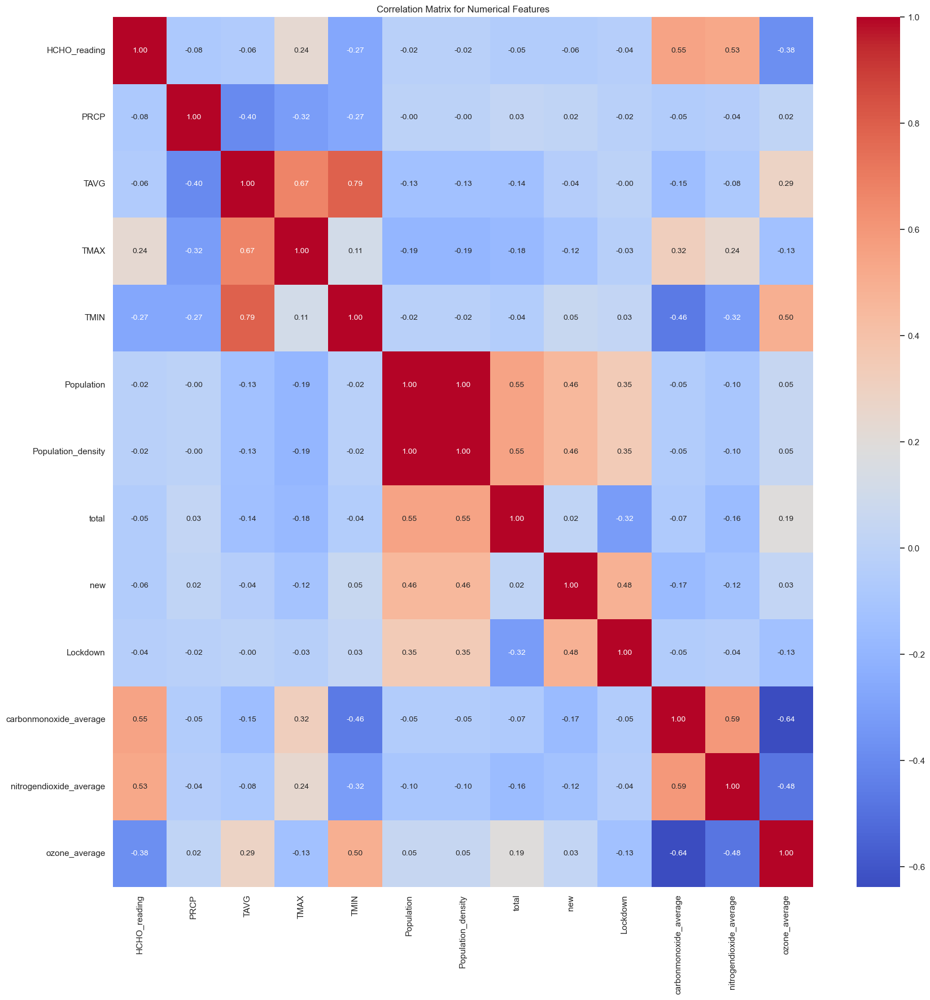

In [46]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only =True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix for Numerical Features')
plt.show()

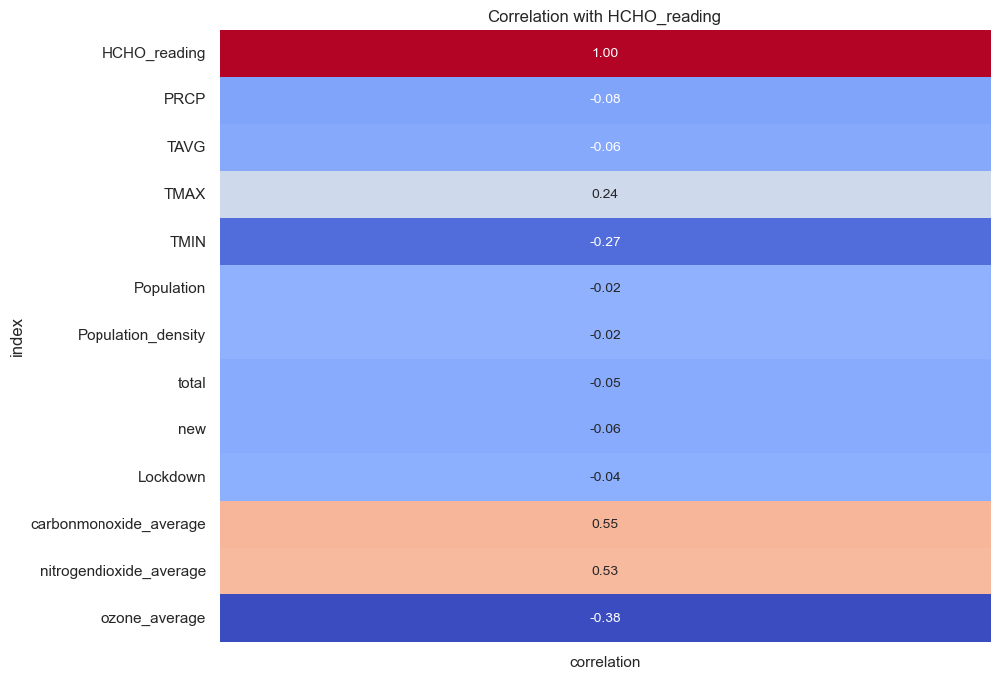

In [47]:
# Select only the correlation of numerical features with 'HCHO_reading'
correlation_with_target = correlation_matrix[['HCHO_reading']].reset_index().rename(columns={'HCHO_reading': 'correlation'})

# Plot the correlation with target as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_with_target.set_index('index'), cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10}, cbar=False)
plt.title('Correlation with HCHO_reading')
plt.show()

In [48]:
df.columns

Index(['Current_Date', 'Next_Date', 'HCHO_reading', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Population', 'Population_density', 'total', 'new', 'Lockdown',
       'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average'],
      dtype='object')

In [49]:
# ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']

C:\Users\janak\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


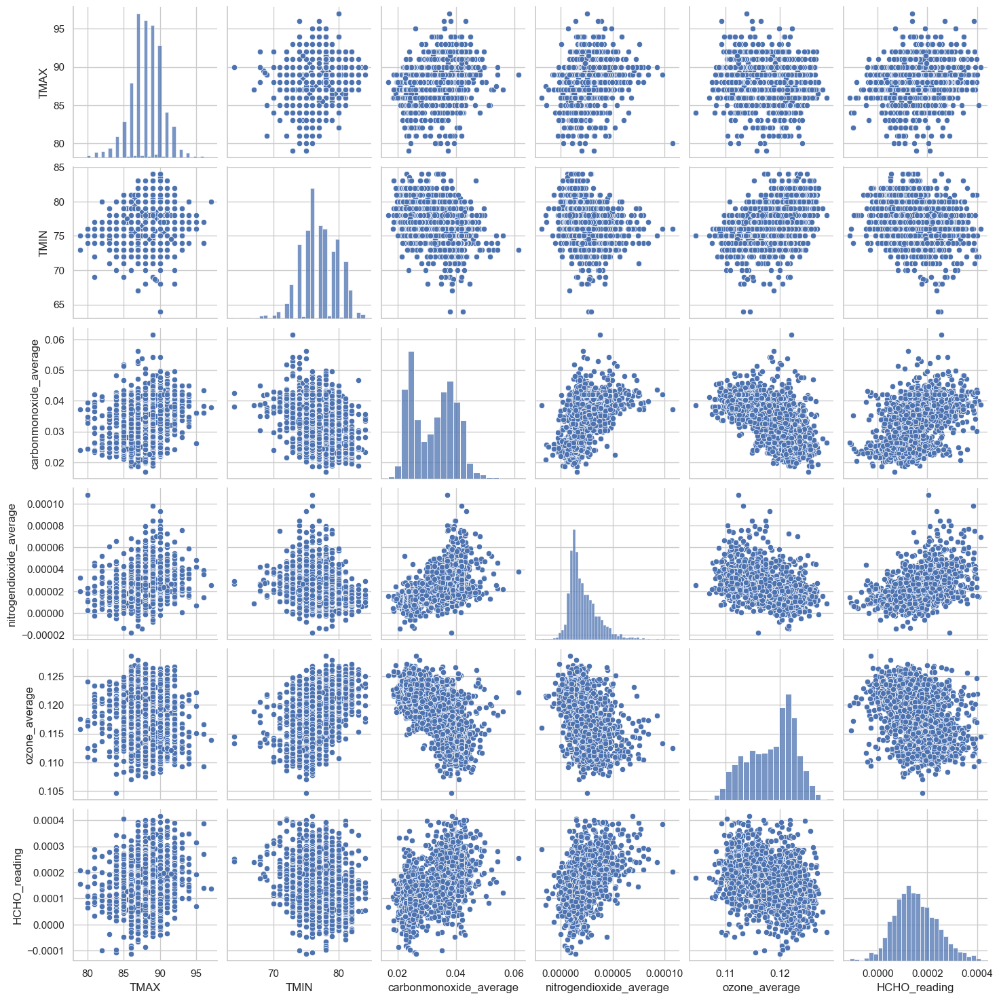

In [50]:
# Select numerical columns for pairplot
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average', 'HCHO_reading']

# Create pairplot
sns.pairplot(df[numerical_columns])
plt.show()

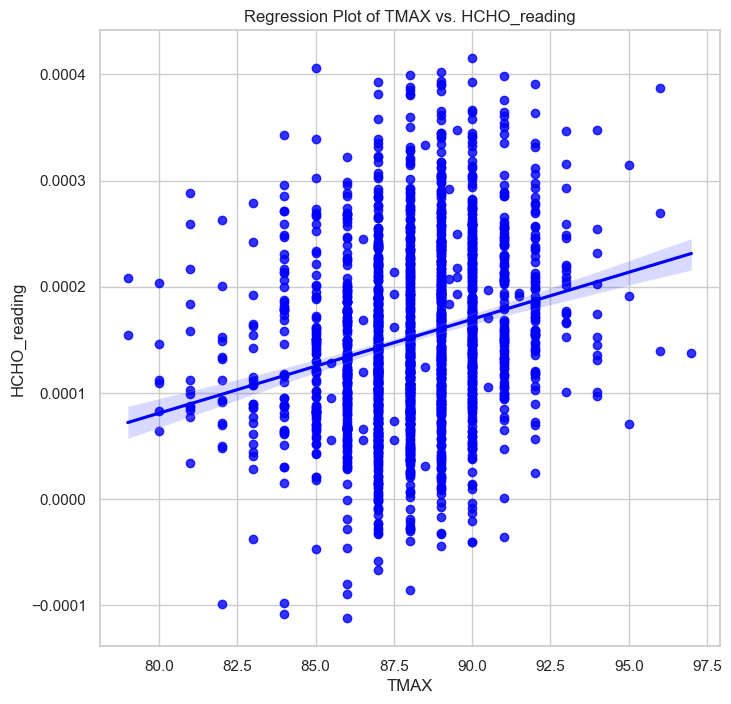

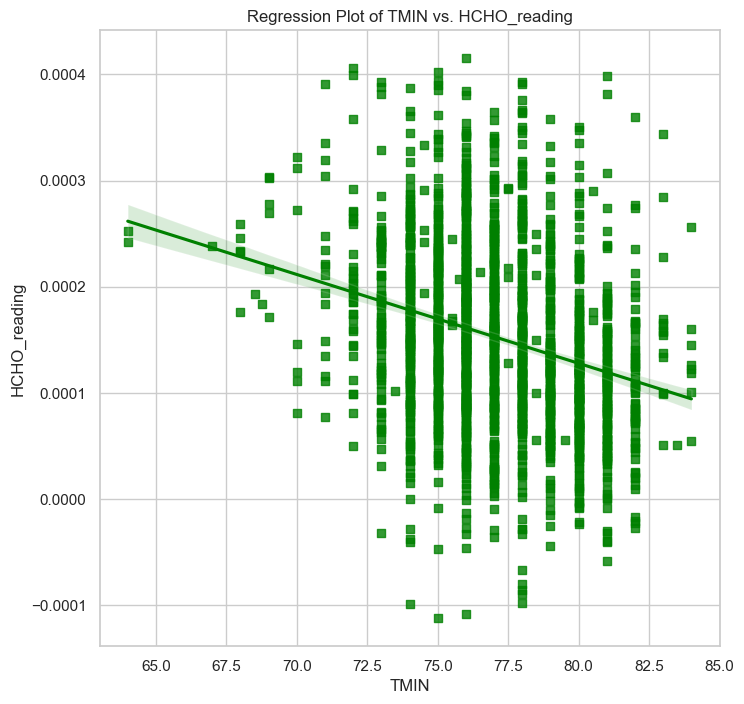

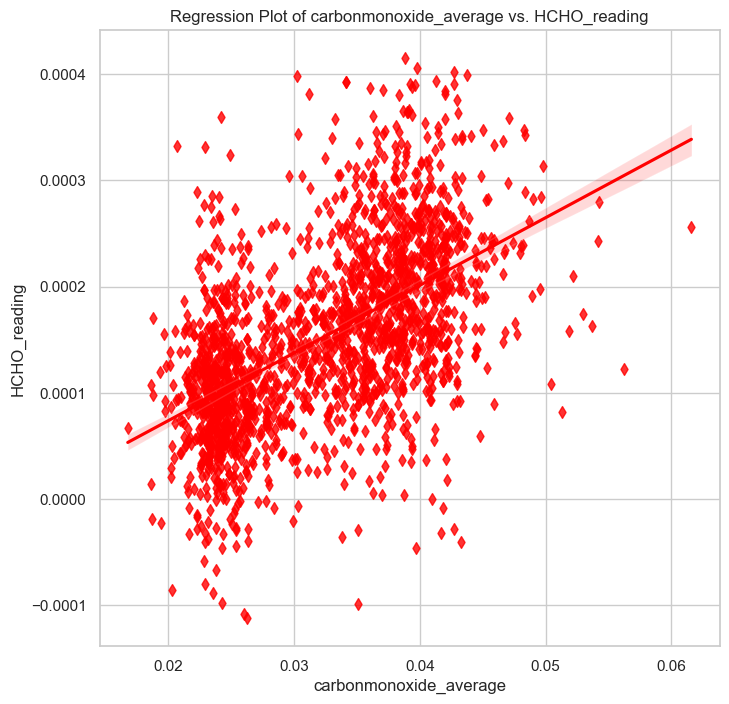

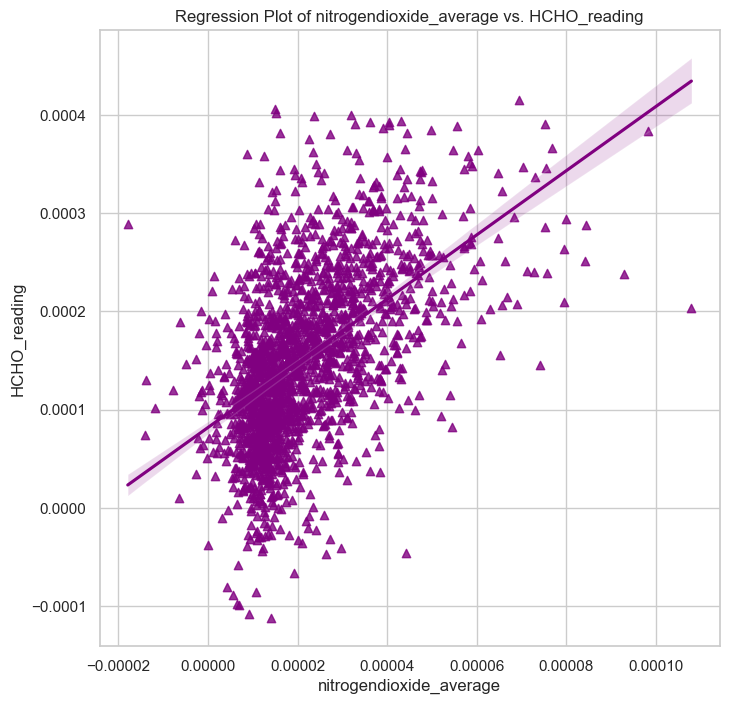

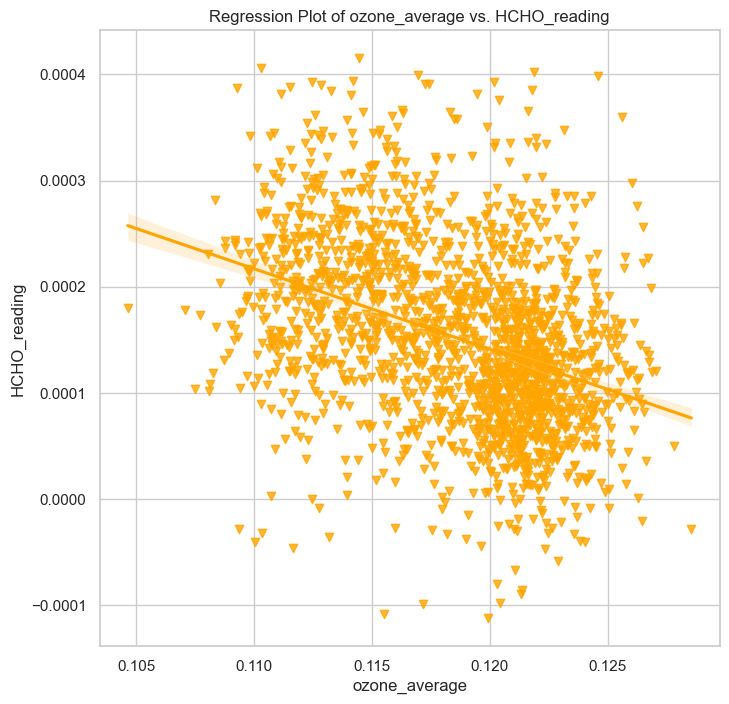

In [51]:
# List of numerical columns
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']

# List of colors for regression plots
colors = ['blue', 'green', 'red', 'purple', 'orange']

# List of markers for regression plots
markers = ['o', 's', 'd', '^', 'v']

# Create regression plots with custom colors and markers
for i, column in enumerate(numerical_columns):
    plt.figure(figsize=(8, 8))
    sns.regplot(x=column, y='HCHO_reading', data=df, color=colors[i], marker=markers[i])
    plt.title(f'Regression Plot of {column} vs. HCHO_reading')
    plt.xlabel(column)
    plt.ylabel('HCHO_reading')
    plt.grid(True)
    plt.show()

In [52]:
merged_df['Location'].unique()

array(['Bibile, Monaragala', 'Colombo Proper', 'Deniyaya, Matara',
       'Jaffna Proper', 'Kandy Proper', 'Kurunegala Proper',
       'Nuwara Eliya Proper'], dtype=object)

# Bibile, Monaragala

In [53]:
df=merged_df[merged_df['Location']=='Bibile, Monaragala']
df.drop(columns=['Location','Sea Proximity Categorised', 
                 'Climate Zone','LATITUDE','LONGITUDE','ELEVATION',
                 'Area(km^2)','Sea Proximity (approximate-km)'],inplace=True)

C:\Users\janak\AppData\Local\Temp\ipykernel_20164\2070459511.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['Location','Sea Proximity Categorised',


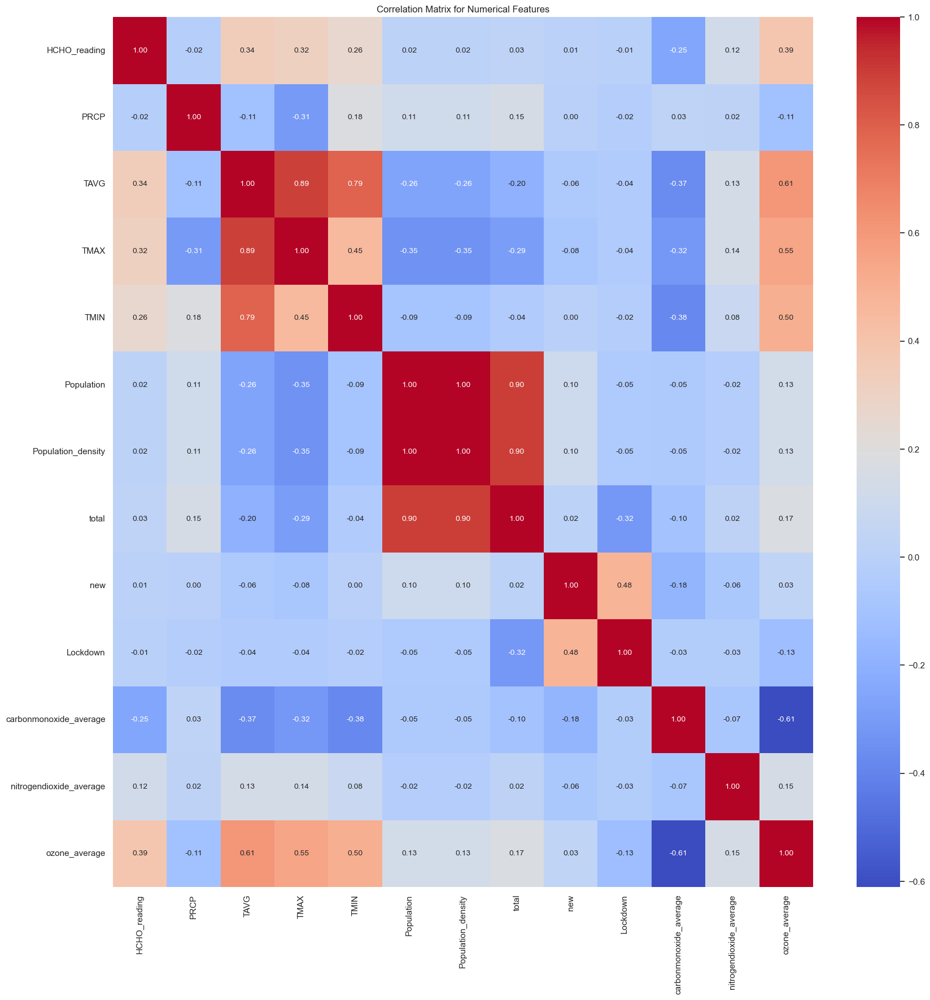

In [54]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only =True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix for Numerical Features')
plt.show()

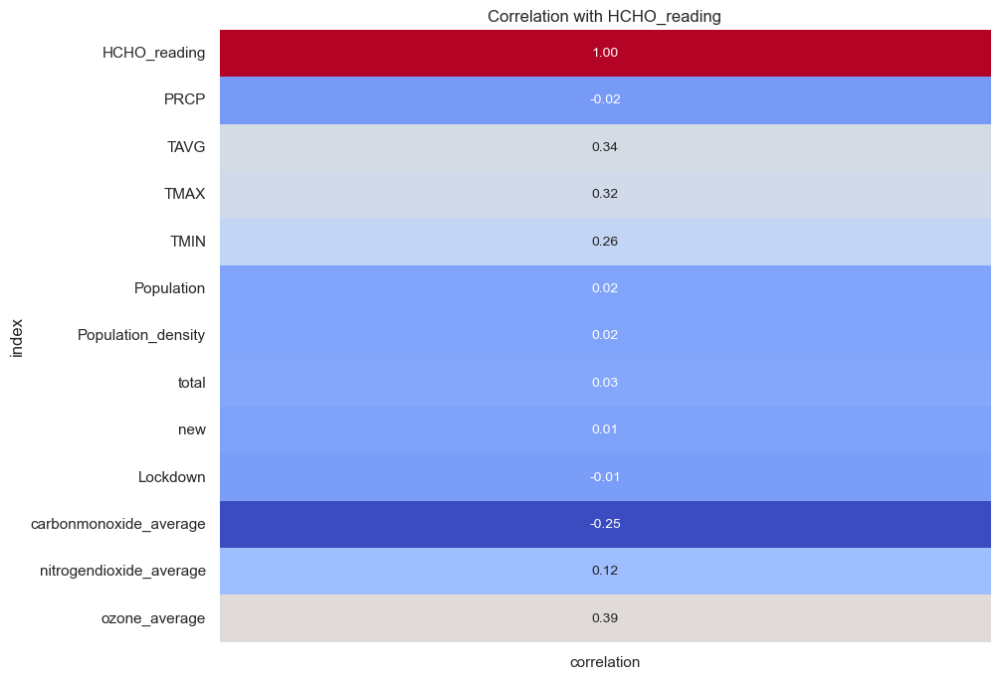

In [55]:
# Select only the correlation of numerical features with 'HCHO_reading'
correlation_with_target = correlation_matrix[['HCHO_reading']].reset_index().rename(columns={'HCHO_reading': 'correlation'})

# Plot the correlation with target as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_with_target.set_index('index'), cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10}, cbar=False)
plt.title('Correlation with HCHO_reading')
plt.show()

In [56]:
df.columns

Index(['Current_Date', 'Next_Date', 'HCHO_reading', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Population', 'Population_density', 'total', 'new', 'Lockdown',
       'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average'],
      dtype='object')

C:\Users\janak\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


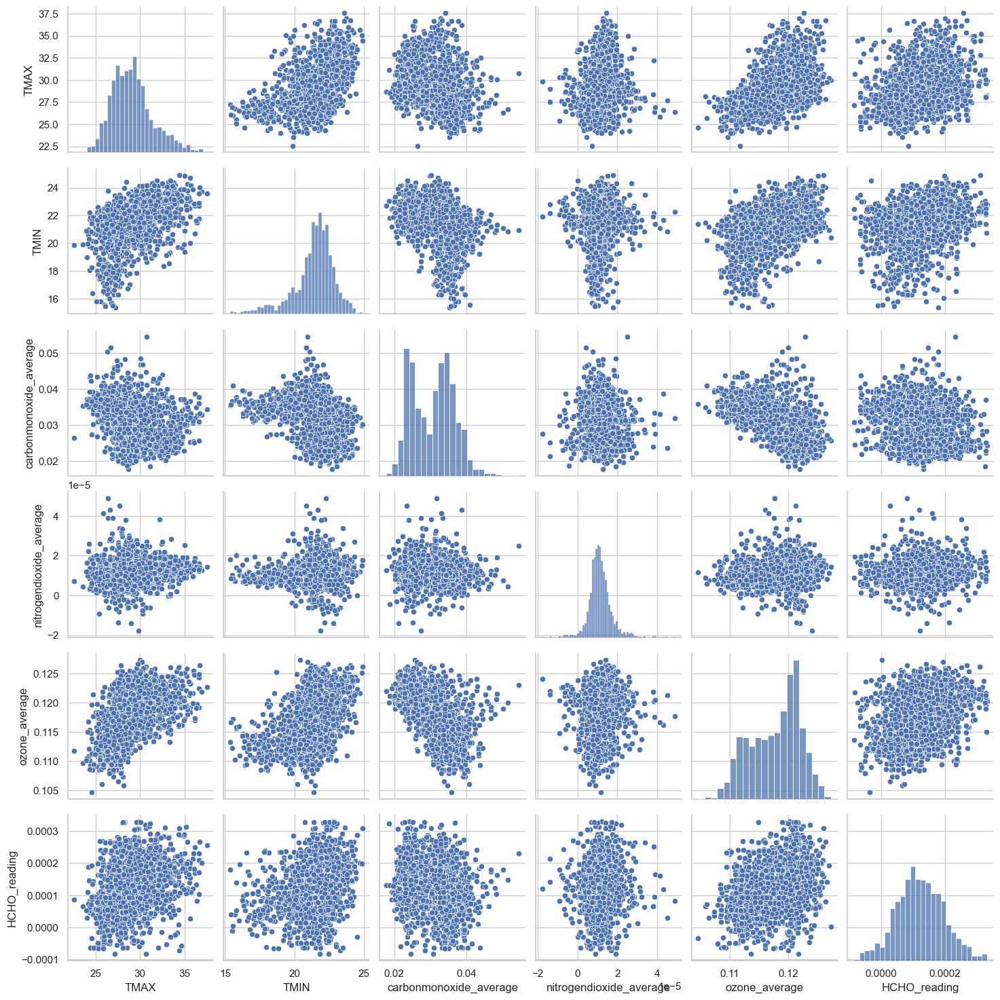

In [57]:
# Select numerical columns for pairplot
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average', 'HCHO_reading']

# Create pairplot
sns.pairplot(df[numerical_columns])
plt.show()

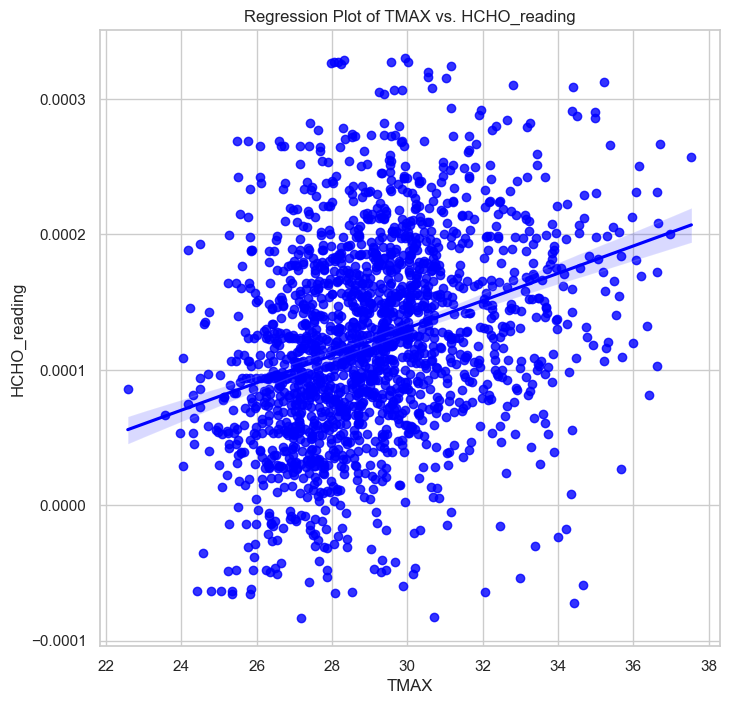

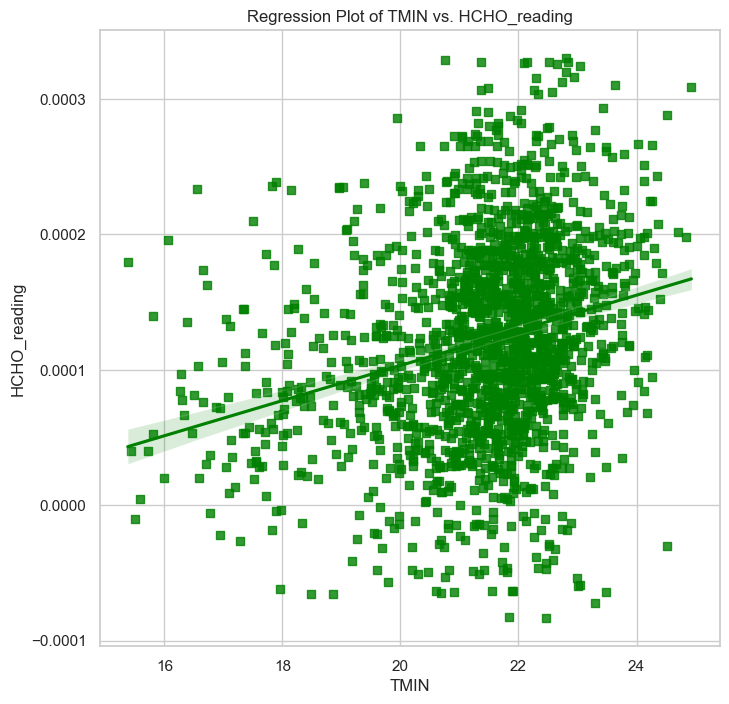

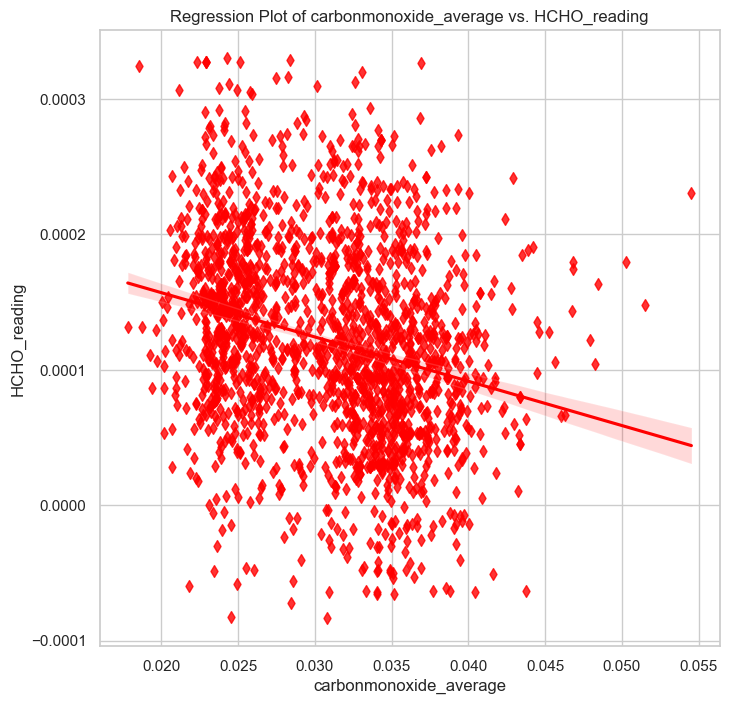

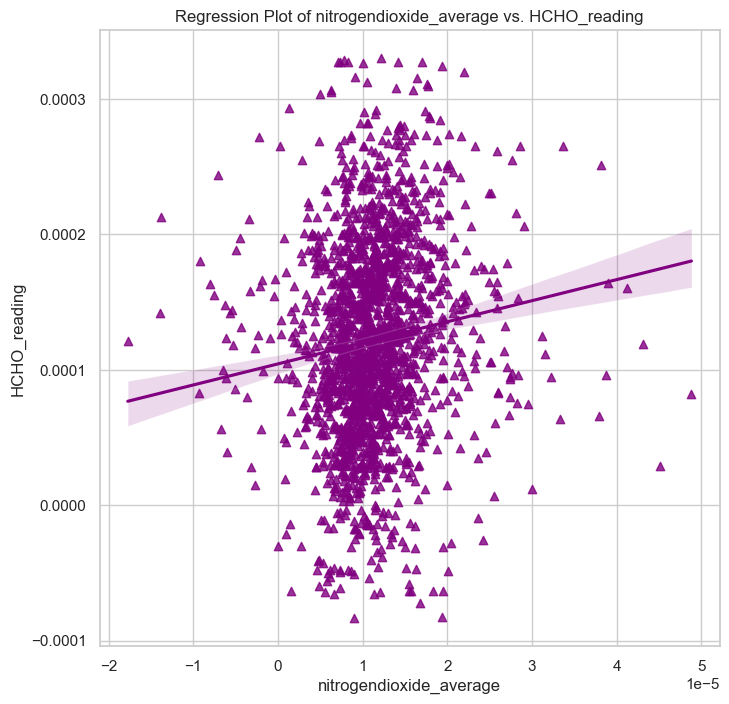

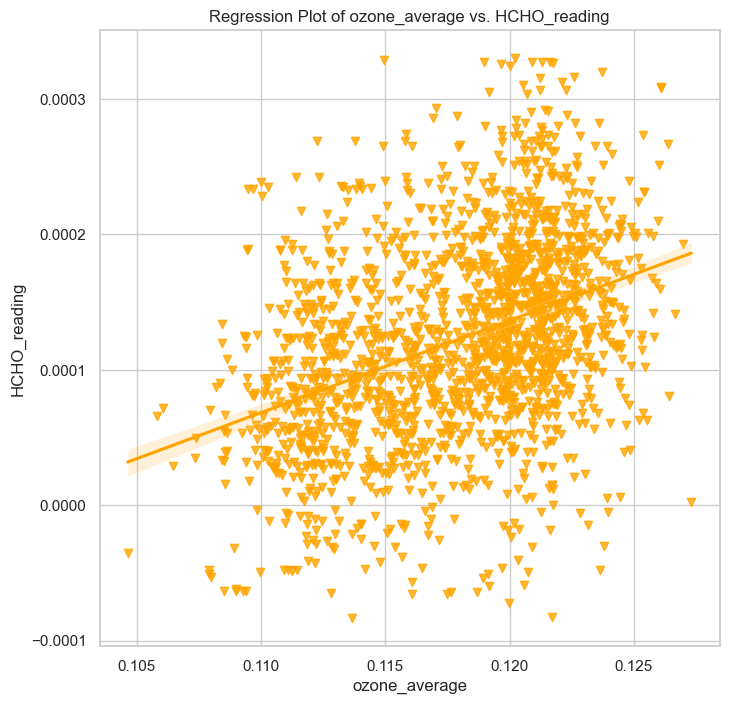

In [59]:
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']
colors = ['blue', 'green', 'red', 'purple', 'orange']

# List of markers for regression plots
markers = ['o', 's', 'd', '^', 'v']

# Create regression plots with custom colors and markers
for i, column in enumerate(numerical_columns):
    plt.figure(figsize=(8, 8))
    sns.regplot(x=column, y='HCHO_reading', data=df, color=colors[i], marker=markers[i])
    plt.title(f'Regression Plot of {column} vs. HCHO_reading')
    plt.xlabel(column)
    plt.ylabel('HCHO_reading')
    plt.grid(True)
    plt.show()

In [52]:
merged_df['Location'].unique()

array(['Bibile, Monaragala', 'Colombo Proper', 'Deniyaya, Matara',
       'Jaffna Proper', 'Kandy Proper', 'Kurunegala Proper',
       'Nuwara Eliya Proper'], dtype=object)

# Deniyaya, Matara

In [66]:
df=merged_df[merged_df['Location']=='Deniyaya, Matara']
df.drop(columns=['Location','Sea Proximity Categorised', 
                 'Climate Zone','LATITUDE','LONGITUDE','ELEVATION',
                 'Area(km^2)','Sea Proximity (approximate-km)'],inplace=True)

C:\Users\janak\AppData\Local\Temp\ipykernel_20164\4062180571.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['Location','Sea Proximity Categorised',


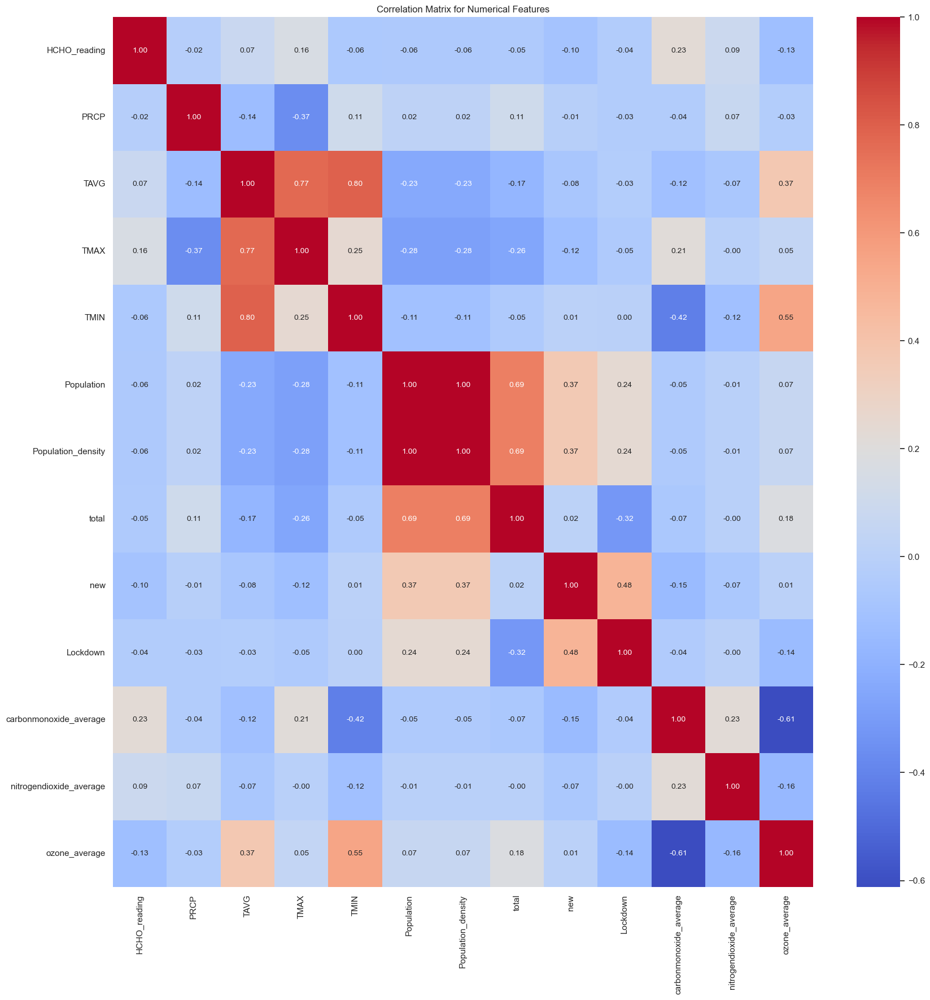

In [67]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only =True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix for Numerical Features')
plt.show()

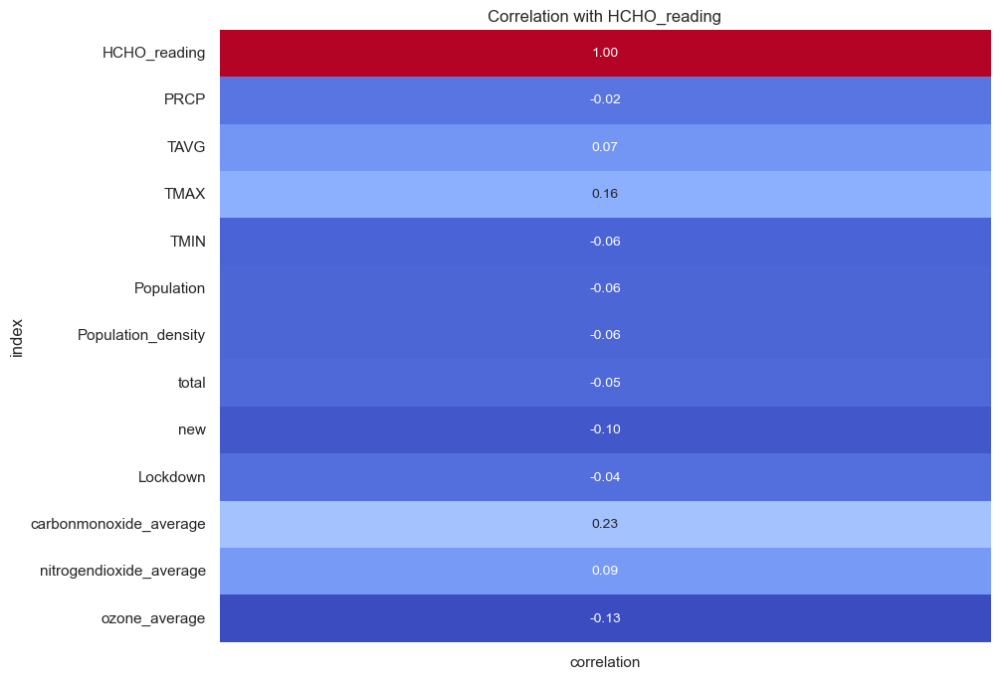

In [68]:
# Select only the correlation of numerical features with 'HCHO_reading'
correlation_with_target = correlation_matrix[['HCHO_reading']].reset_index().rename(columns={'HCHO_reading': 'correlation'})

# Plot the correlation with target as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_with_target.set_index('index'), cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10}, cbar=False)
plt.title('Correlation with HCHO_reading')
plt.show()

In [69]:
df.columns

Index(['Current_Date', 'Next_Date', 'HCHO_reading', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Population', 'Population_density', 'total', 'new', 'Lockdown',
       'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average'],
      dtype='object')

C:\Users\janak\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


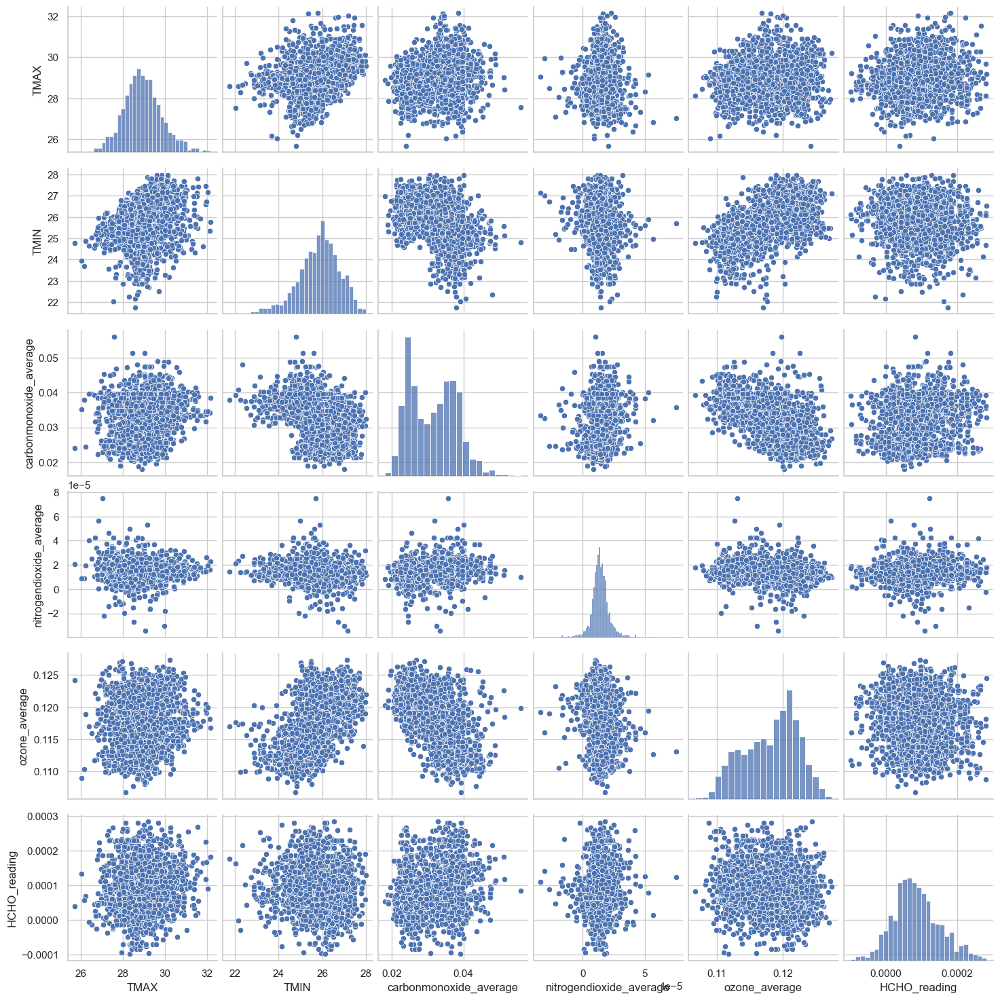

In [70]:
# Select numerical columns for pairplot
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average', 'HCHO_reading']

# Create pairplot
sns.pairplot(df[numerical_columns])
plt.show()

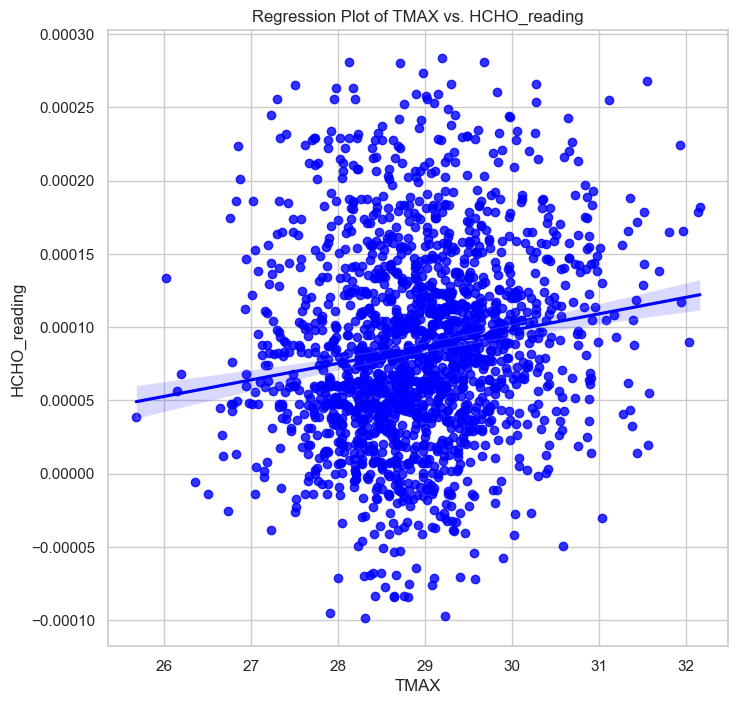

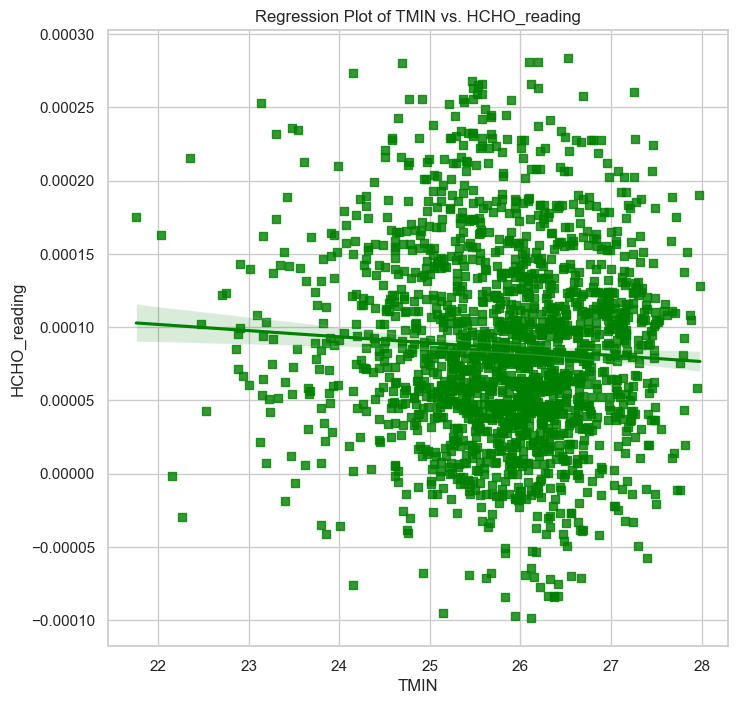

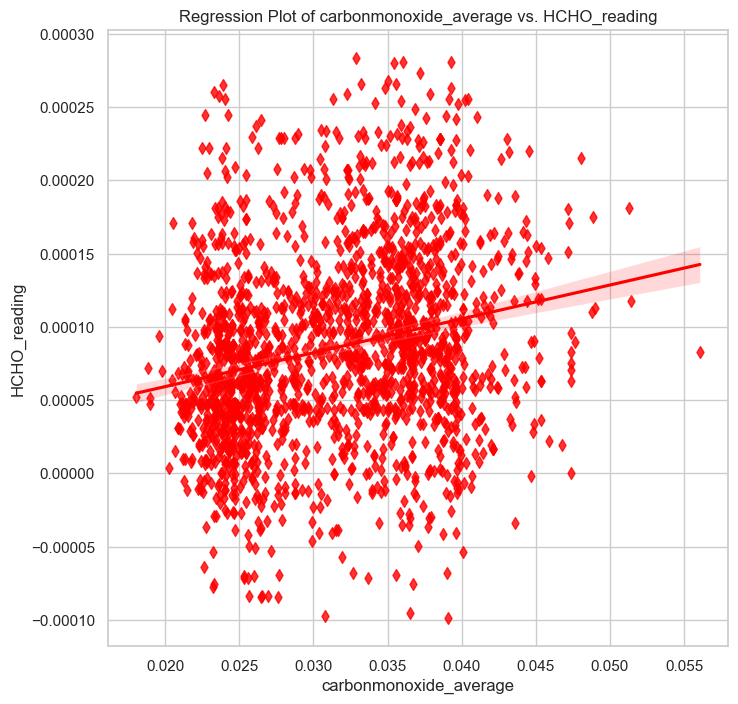

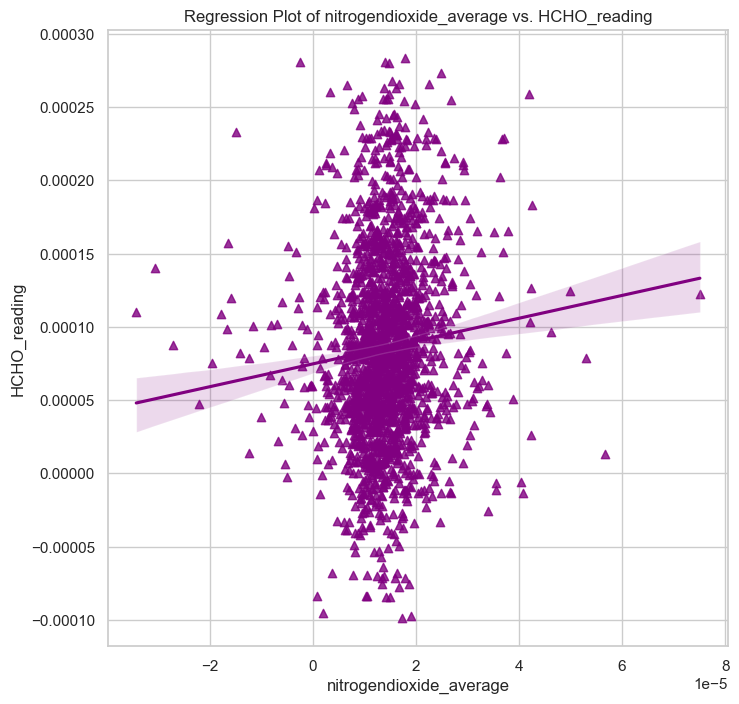

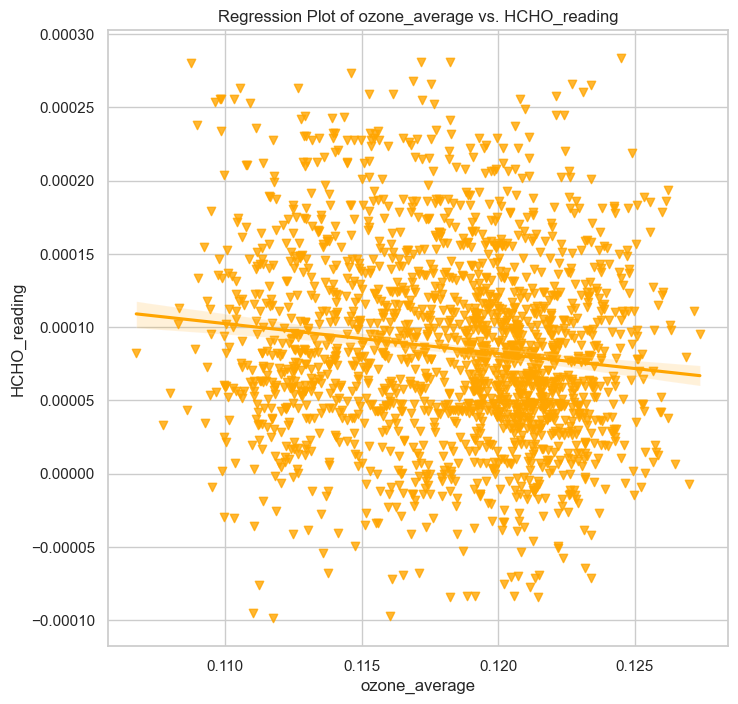

In [71]:
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']
colors = ['blue', 'green', 'red', 'purple', 'orange']

# List of markers for regression plots
markers = ['o', 's', 'd', '^', 'v']

# Create regression plots with custom colors and markers
for i, column in enumerate(numerical_columns):
    plt.figure(figsize=(8, 8))
    sns.regplot(x=column, y='HCHO_reading', data=df, color=colors[i], marker=markers[i])
    plt.title(f'Regression Plot of {column} vs. HCHO_reading')
    plt.xlabel(column)
    plt.ylabel('HCHO_reading')
    plt.grid(True)
    plt.show()

In [52]:
merged_df['Location'].unique()

array(['Bibile, Monaragala', 'Colombo Proper', 'Deniyaya, Matara',
       'Jaffna Proper', 'Kandy Proper', 'Kurunegala Proper',
       'Nuwara Eliya Proper'], dtype=object)

# Jaffna Proper

In [72]:
df=merged_df[merged_df['Location']=='Jaffna Proper']
df.drop(columns=['Location','Sea Proximity Categorised', 
                 'Climate Zone','LATITUDE','LONGITUDE','ELEVATION',
                 'Area(km^2)','Sea Proximity (approximate-km)'],inplace=True)

C:\Users\janak\AppData\Local\Temp\ipykernel_20164\1677411757.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['Location','Sea Proximity Categorised',


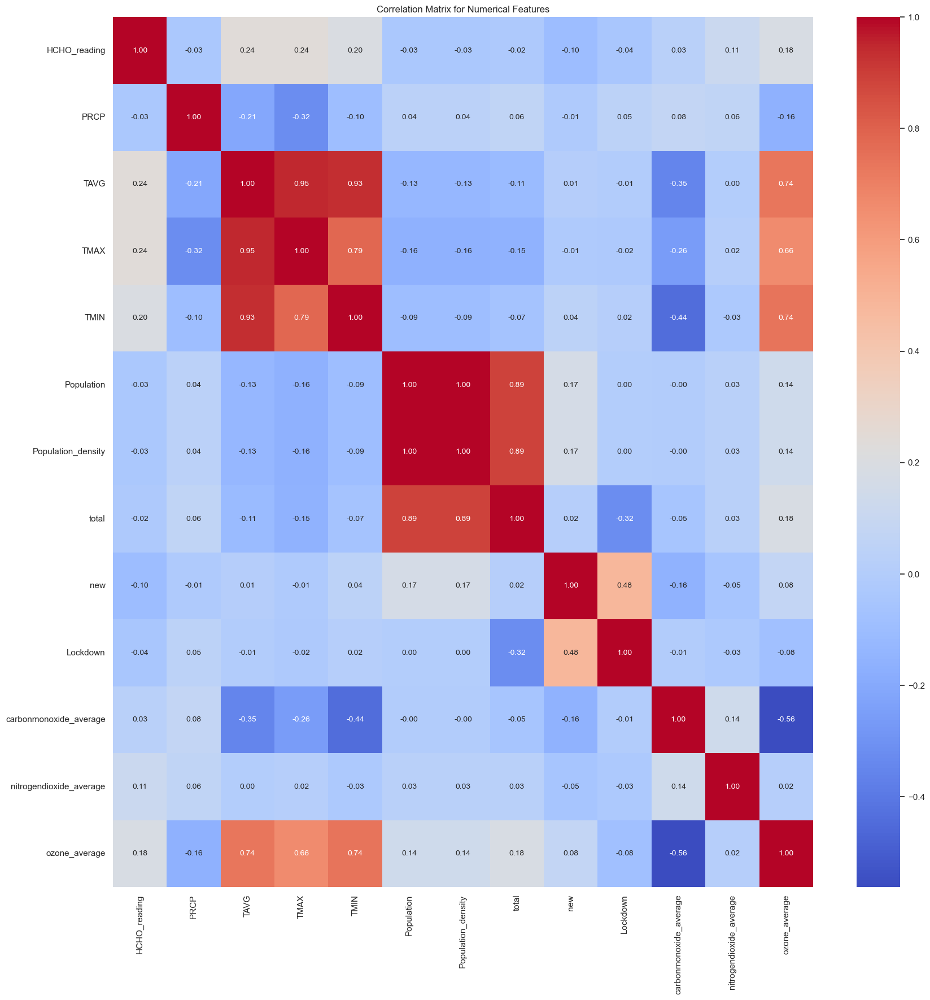

In [73]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only =True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix for Numerical Features')
plt.show()

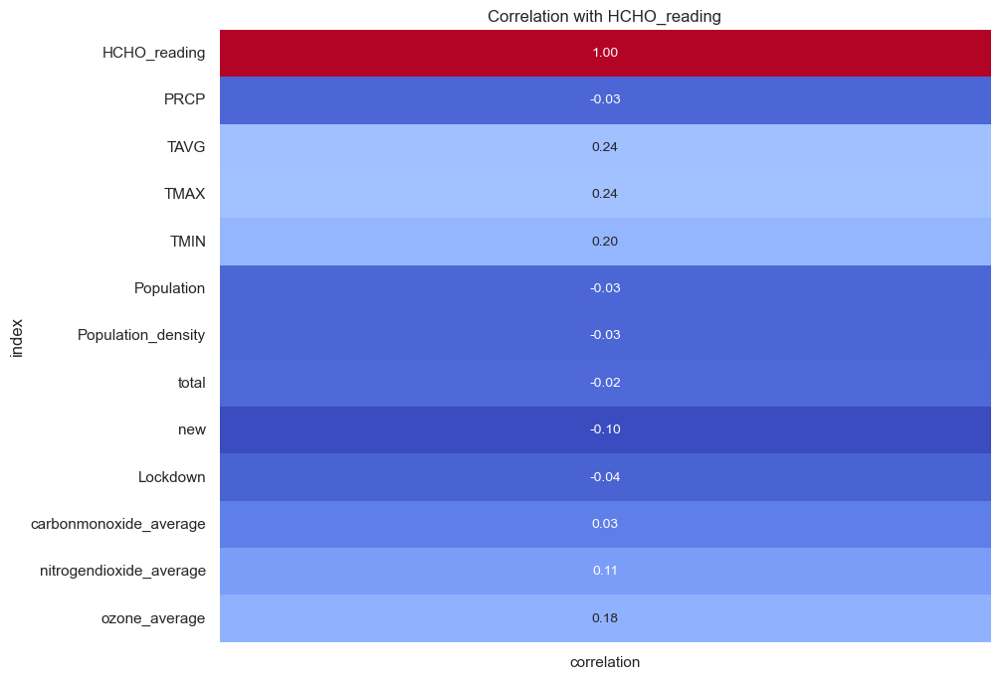

In [74]:
# Select only the correlation of numerical features with 'HCHO_reading'
correlation_with_target = correlation_matrix[['HCHO_reading']].reset_index().rename(columns={'HCHO_reading': 'correlation'})

# Plot the correlation with target as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_with_target.set_index('index'), cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10}, cbar=False)
plt.title('Correlation with HCHO_reading')
plt.show()

In [75]:
df.columns

Index(['Current_Date', 'Next_Date', 'HCHO_reading', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Population', 'Population_density', 'total', 'new', 'Lockdown',
       'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average'],
      dtype='object')

C:\Users\janak\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


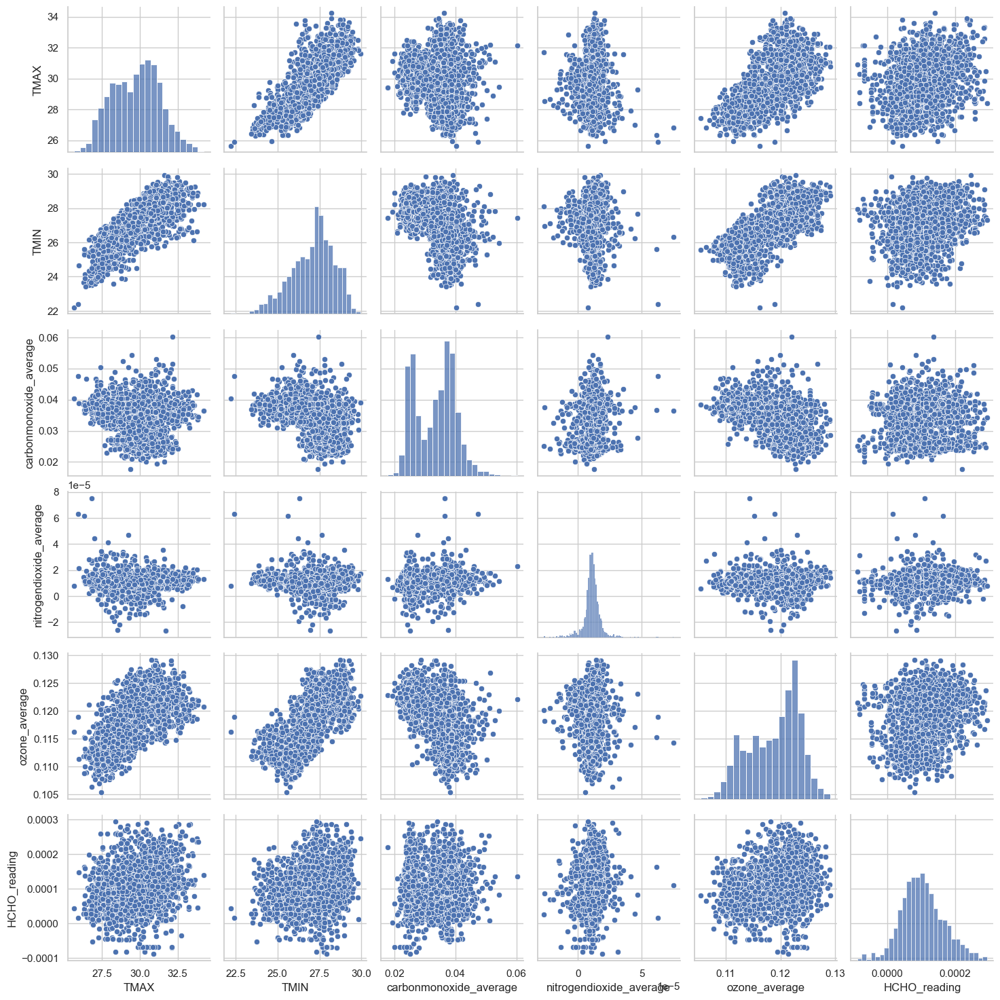

In [76]:
# Select numerical columns for pairplot
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average', 'HCHO_reading']

# Create pairplot
sns.pairplot(df[numerical_columns])
plt.show()

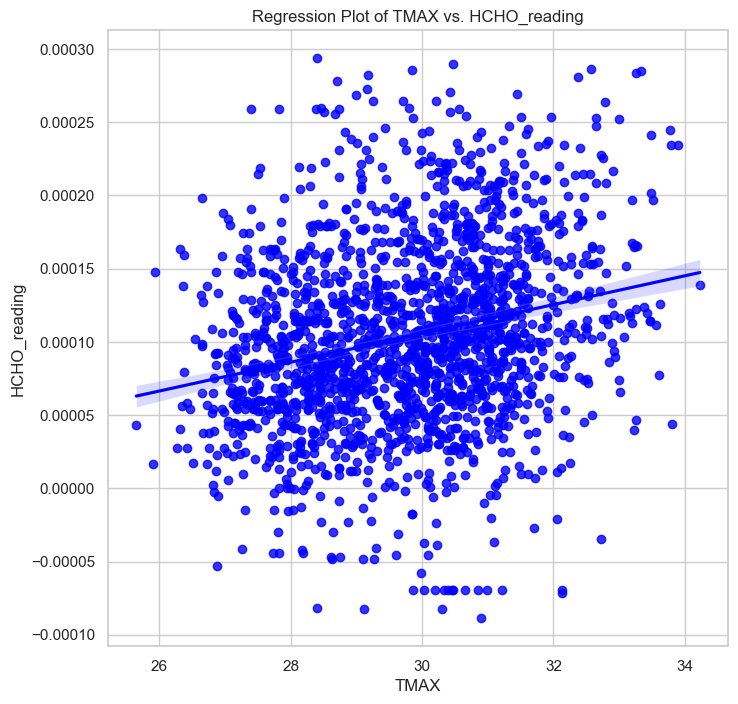

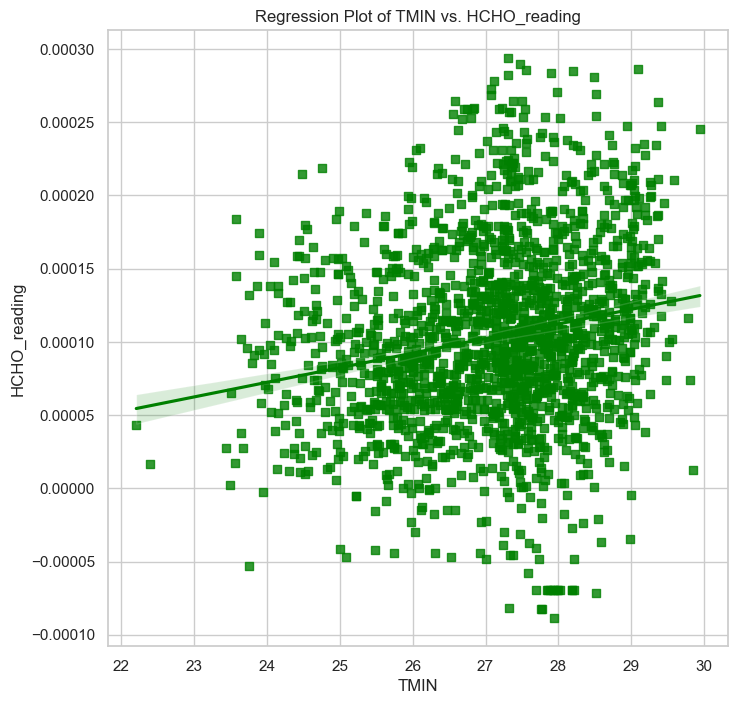

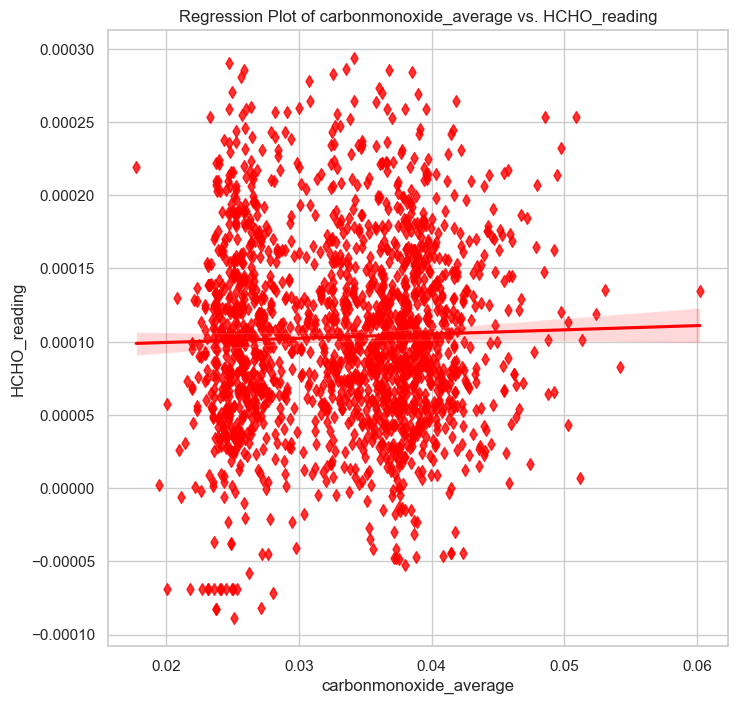

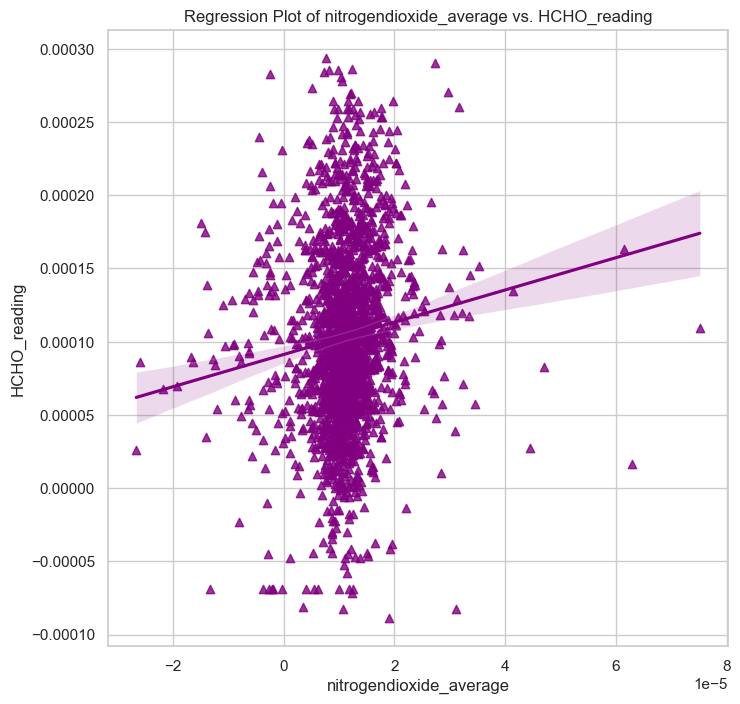

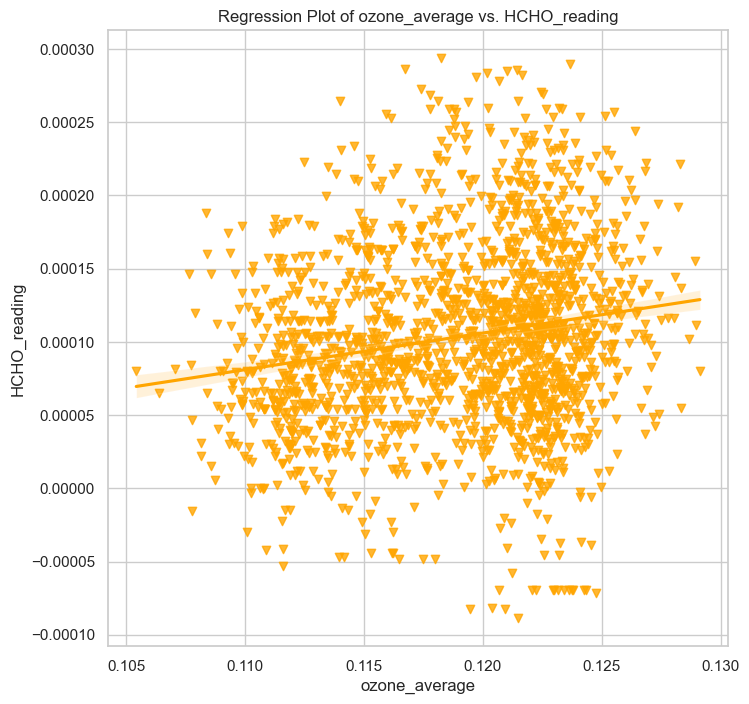

In [77]:
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']
colors = ['blue', 'green', 'red', 'purple', 'orange']

# List of markers for regression plots
markers = ['o', 's', 'd', '^', 'v']

# Create regression plots with custom colors and markers
for i, column in enumerate(numerical_columns):
    plt.figure(figsize=(8, 8))
    sns.regplot(x=column, y='HCHO_reading', data=df, color=colors[i], marker=markers[i])
    plt.title(f'Regression Plot of {column} vs. HCHO_reading')
    plt.xlabel(column)
    plt.ylabel('HCHO_reading')
    plt.grid(True)
    plt.show()

In [52]:
merged_df['Location'].unique()

array(['Bibile, Monaragala', 'Colombo Proper', 'Deniyaya, Matara',
       'Jaffna Proper', 'Kandy Proper', 'Kurunegala Proper',
       'Nuwara Eliya Proper'], dtype=object)

# Kandy Proper

In [78]:
df=merged_df[merged_df['Location']=='Kandy Proper']
df.drop(columns=['Location','Sea Proximity Categorised', 
                 'Climate Zone','LATITUDE','LONGITUDE','ELEVATION',
                 'Area(km^2)','Sea Proximity (approximate-km)'],inplace=True)

C:\Users\janak\AppData\Local\Temp\ipykernel_20164\3658740470.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['Location','Sea Proximity Categorised',


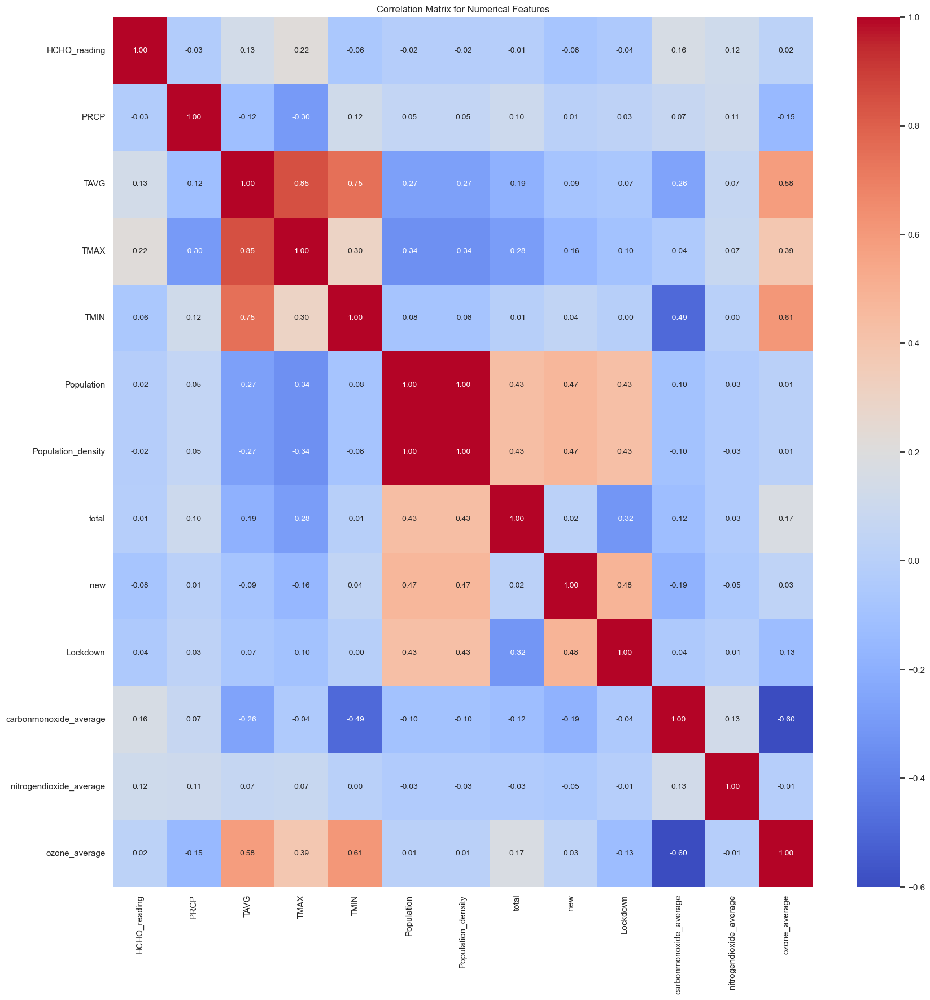

In [79]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only =True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix for Numerical Features')
plt.show()

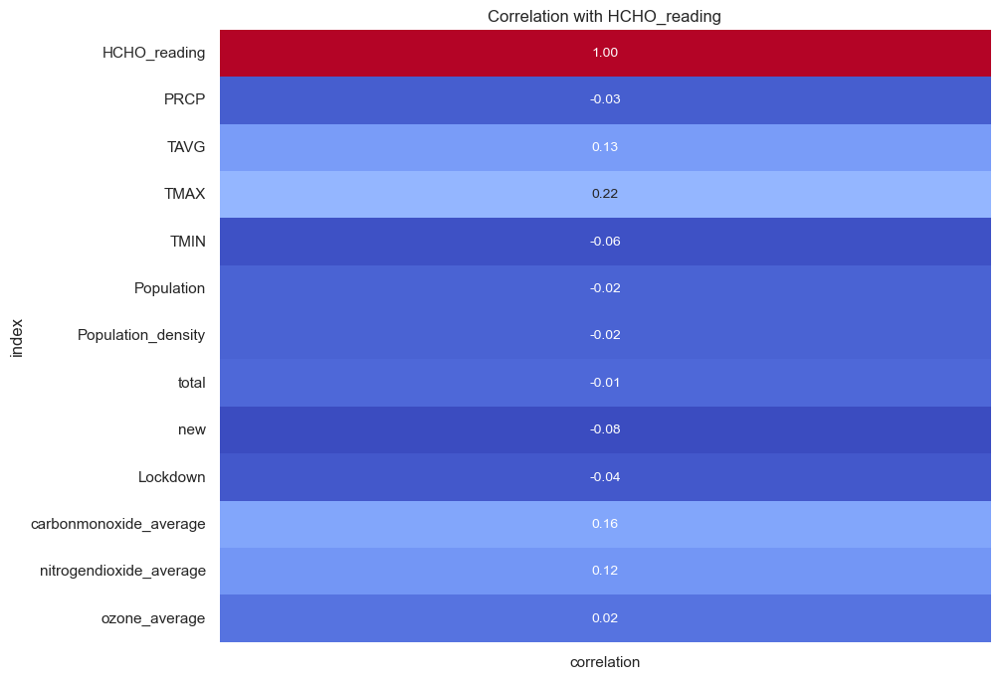

In [80]:
# Select only the correlation of numerical features with 'HCHO_reading'
correlation_with_target = correlation_matrix[['HCHO_reading']].reset_index().rename(columns={'HCHO_reading': 'correlation'})

# Plot the correlation with target as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_with_target.set_index('index'), cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10}, cbar=False)
plt.title('Correlation with HCHO_reading')
plt.show()

In [81]:
df.columns

Index(['Current_Date', 'Next_Date', 'HCHO_reading', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Population', 'Population_density', 'total', 'new', 'Lockdown',
       'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average'],
      dtype='object')

C:\Users\janak\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


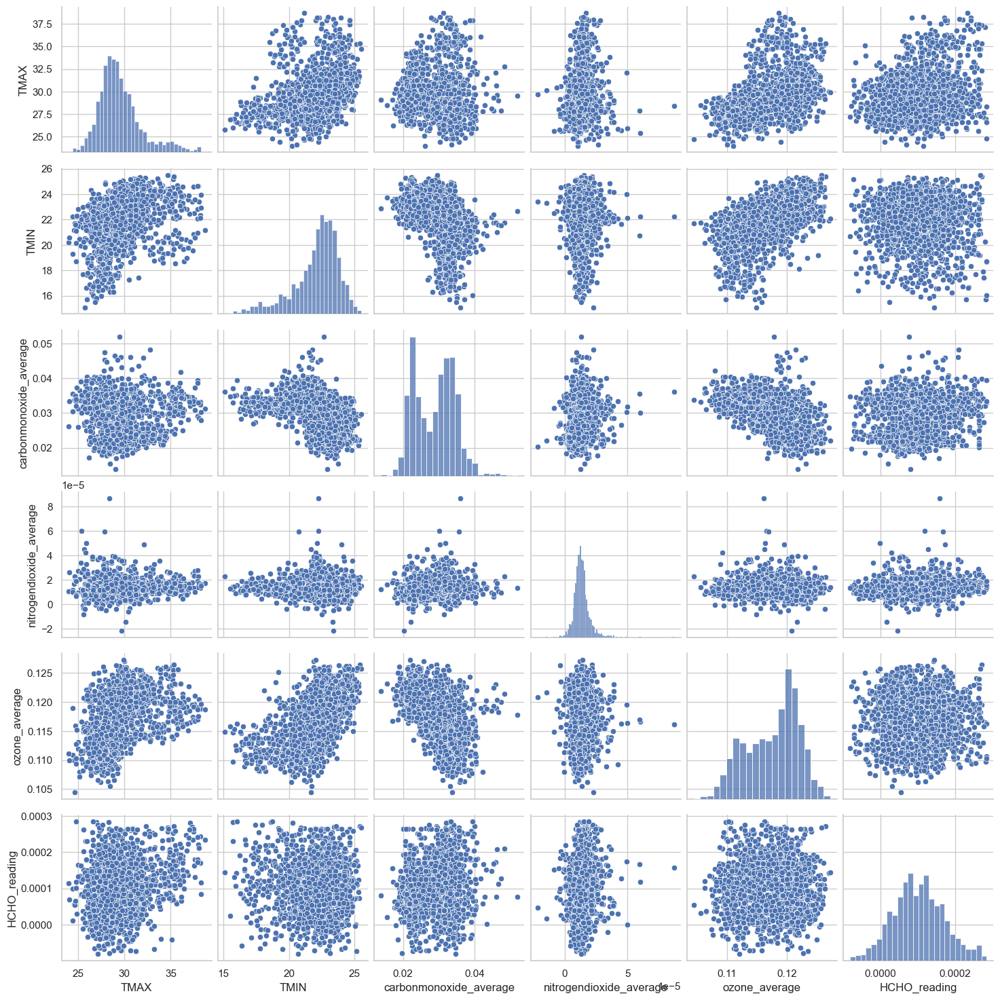

In [82]:
# Select numerical columns for pairplot
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average', 'HCHO_reading']

# Create pairplot
sns.pairplot(df[numerical_columns])
plt.show()

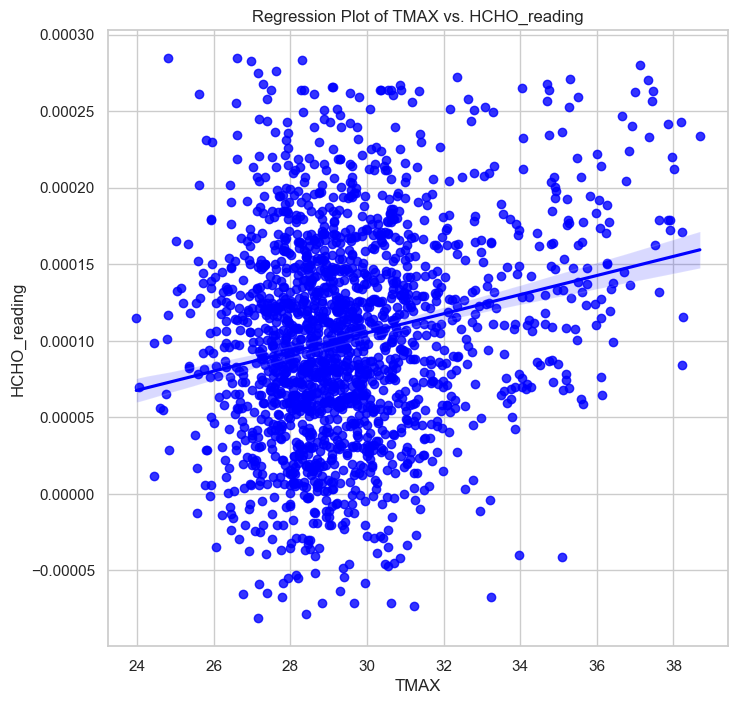

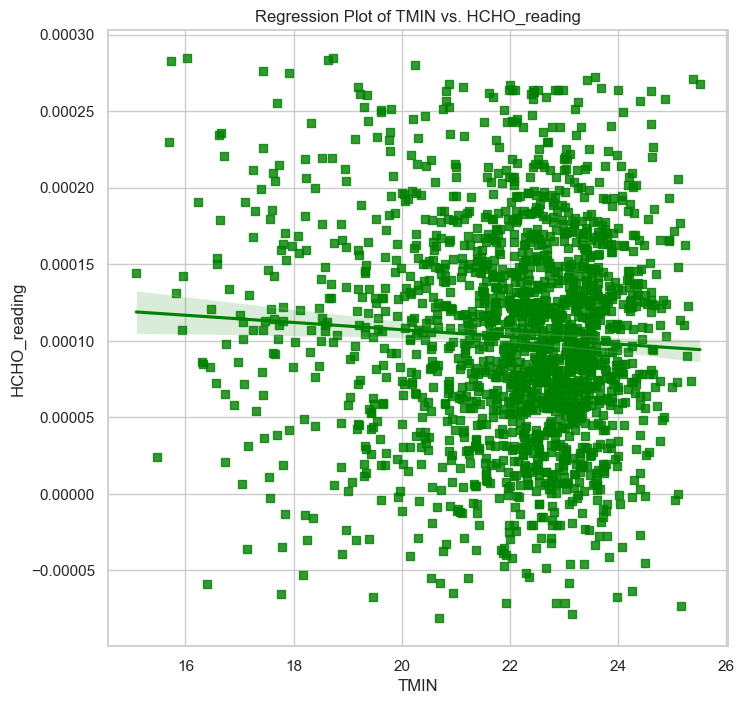

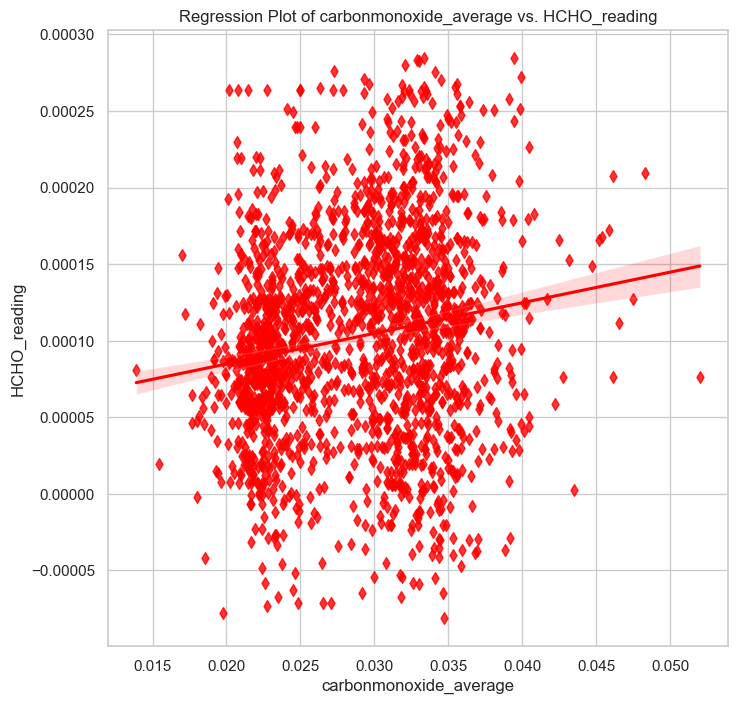

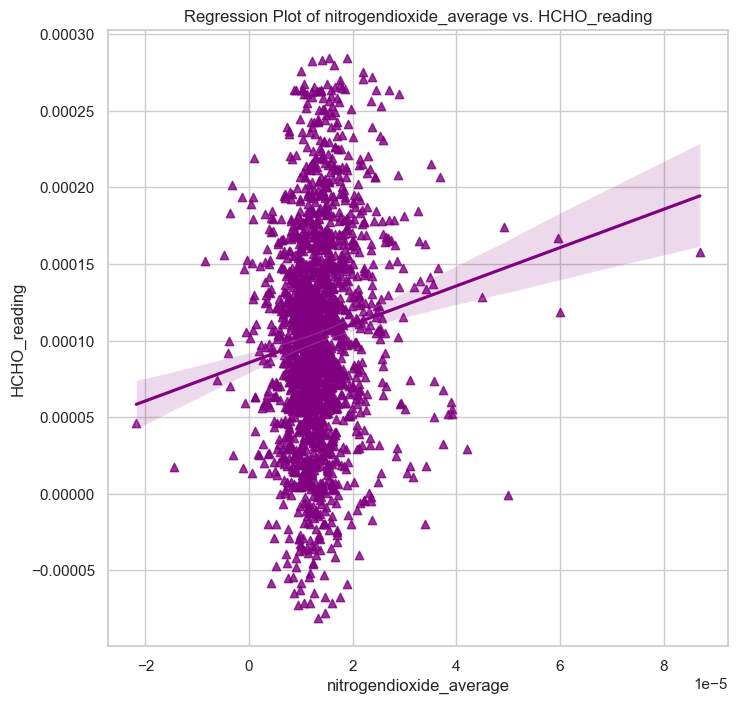

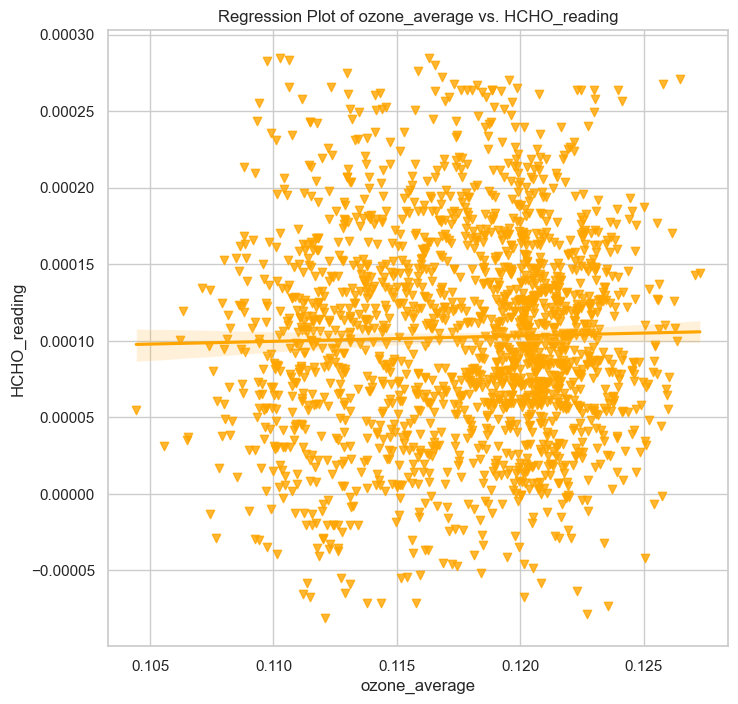

In [83]:
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']
colors = ['blue', 'green', 'red', 'purple', 'orange']

# List of markers for regression plots
markers = ['o', 's', 'd', '^', 'v']

# Create regression plots with custom colors and markers
for i, column in enumerate(numerical_columns):
    plt.figure(figsize=(8, 8))
    sns.regplot(x=column, y='HCHO_reading', data=df, color=colors[i], marker=markers[i])
    plt.title(f'Regression Plot of {column} vs. HCHO_reading')
    plt.xlabel(column)
    plt.ylabel('HCHO_reading')
    plt.grid(True)
    plt.show()

In [52]:
merged_df['Location'].unique()

array(['Bibile, Monaragala', 'Colombo Proper', 'Deniyaya, Matara',
       'Jaffna Proper', 'Kandy Proper', 'Kurunegala Proper',
       'Nuwara Eliya Proper'], dtype=object)

# Kurunegala Proper

In [84]:
df=merged_df[merged_df['Location']=='Kurunegala Proper']
df.drop(columns=['Location','Sea Proximity Categorised', 
                 'Climate Zone','LATITUDE','LONGITUDE','ELEVATION',
                 'Area(km^2)','Sea Proximity (approximate-km)'],inplace=True)

C:\Users\janak\AppData\Local\Temp\ipykernel_20164\1833470842.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['Location','Sea Proximity Categorised',


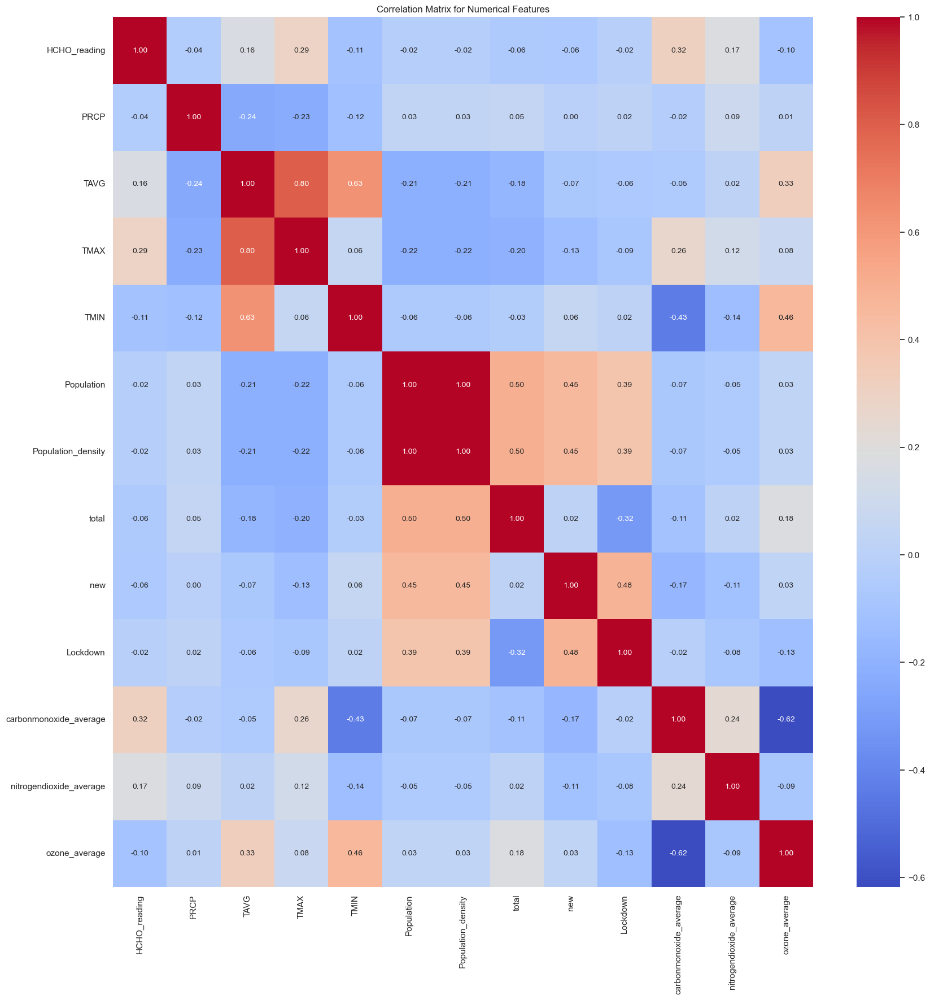

In [85]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only =True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix for Numerical Features')
plt.show()

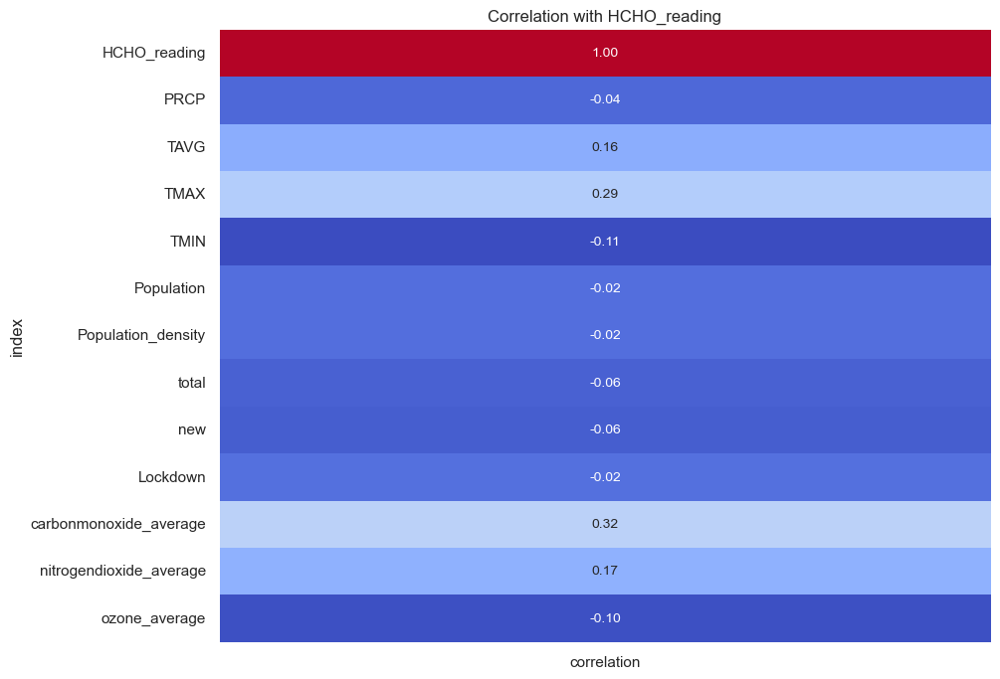

In [86]:
# Select only the correlation of numerical features with 'HCHO_reading'
correlation_with_target = correlation_matrix[['HCHO_reading']].reset_index().rename(columns={'HCHO_reading': 'correlation'})

# Plot the correlation with target as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_with_target.set_index('index'), cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10}, cbar=False)
plt.title('Correlation with HCHO_reading')
plt.show()

In [87]:
df.columns

Index(['Current_Date', 'Next_Date', 'HCHO_reading', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Population', 'Population_density', 'total', 'new', 'Lockdown',
       'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average'],
      dtype='object')

C:\Users\janak\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


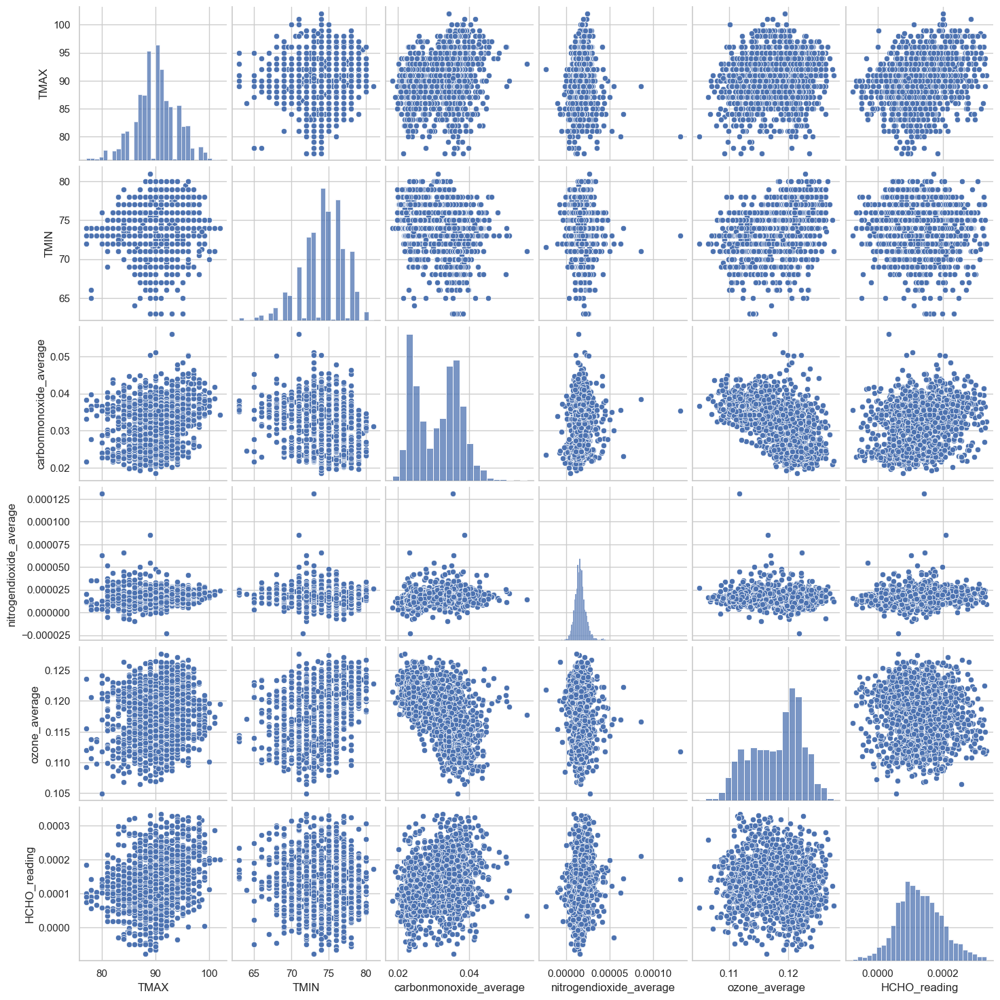

In [88]:
# Select numerical columns for pairplot
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average', 'HCHO_reading']

# Create pairplot
sns.pairplot(df[numerical_columns])
plt.show()

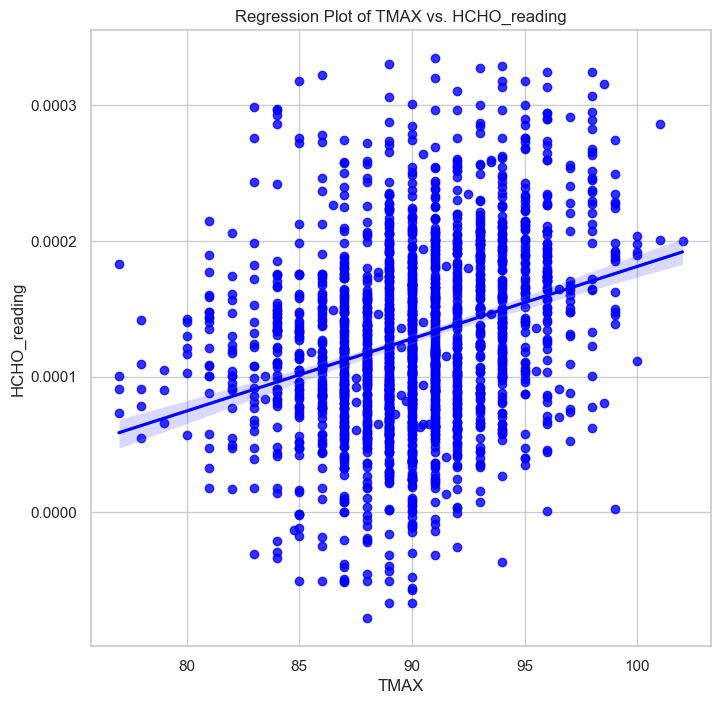

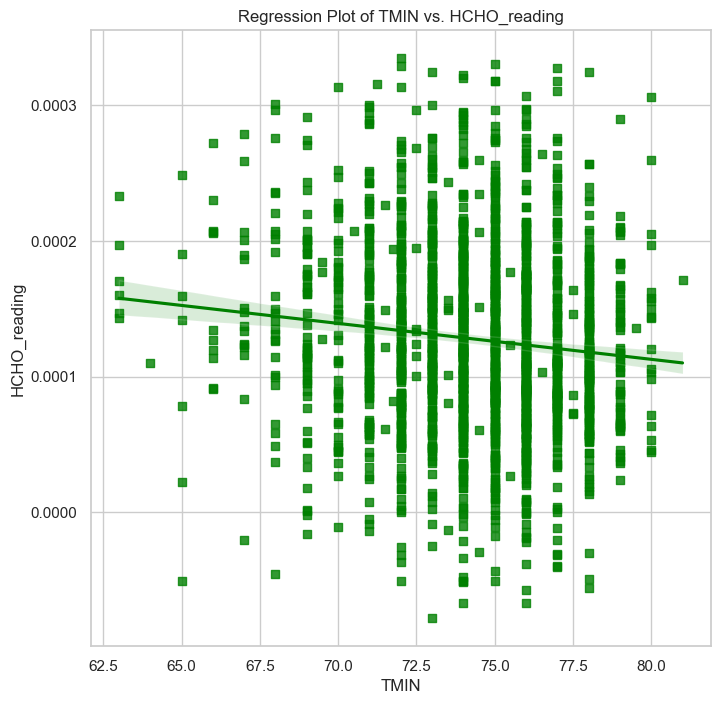

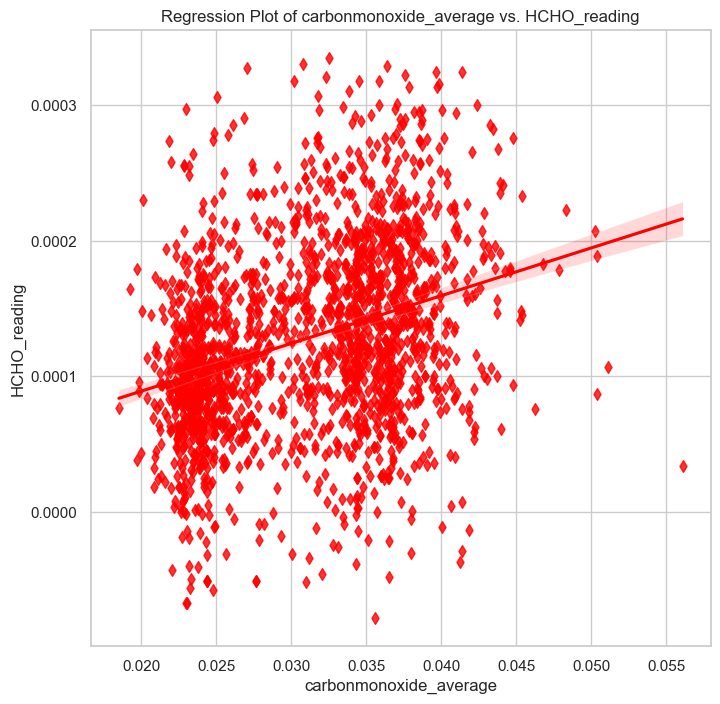

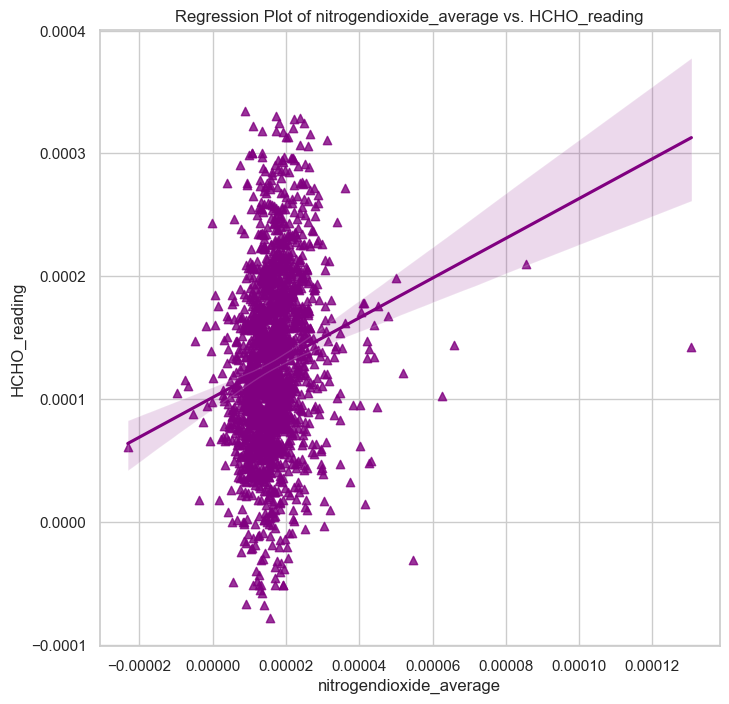

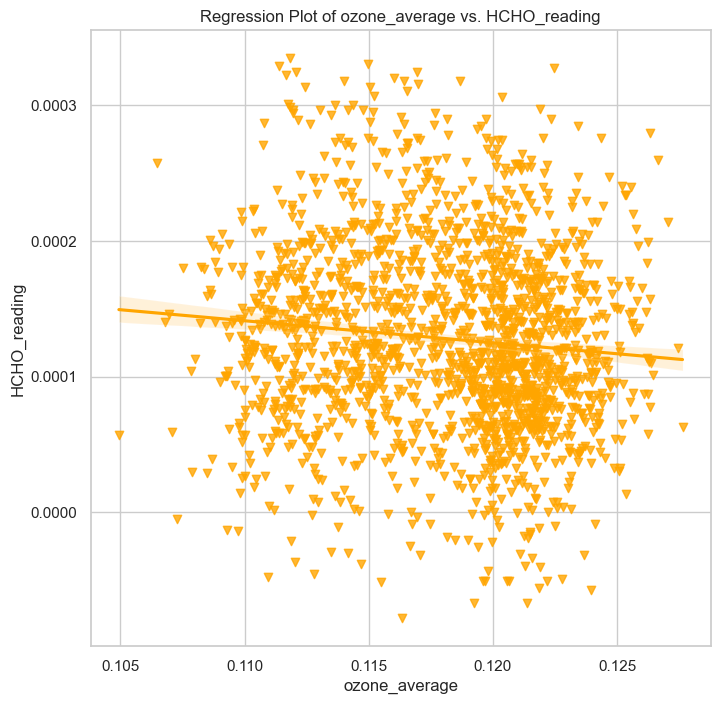

In [89]:
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']
colors = ['blue', 'green', 'red', 'purple', 'orange']

# List of markers for regression plots
markers = ['o', 's', 'd', '^', 'v']

# Create regression plots with custom colors and markers
for i, column in enumerate(numerical_columns):
    plt.figure(figsize=(8, 8))
    sns.regplot(x=column, y='HCHO_reading', data=df, color=colors[i], marker=markers[i])
    plt.title(f'Regression Plot of {column} vs. HCHO_reading')
    plt.xlabel(column)
    plt.ylabel('HCHO_reading')
    plt.grid(True)
    plt.show()

In [52]:
merged_df['Location'].unique()

array(['Bibile, Monaragala', 'Colombo Proper', 'Deniyaya, Matara',
       'Jaffna Proper', 'Kandy Proper', 'Kurunegala Proper',
       'Nuwara Eliya Proper'], dtype=object)

# Nuwara Eliya Proper

In [90]:
df=merged_df[merged_df['Location']=='Nuwara Eliya Proper']
df.drop(columns=['Location','Sea Proximity Categorised', 
                 'Climate Zone','LATITUDE','LONGITUDE','ELEVATION',
                 'Area(km^2)','Sea Proximity (approximate-km)'],inplace=True)

C:\Users\janak\AppData\Local\Temp\ipykernel_20164\2036201062.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(columns=['Location','Sea Proximity Categorised',


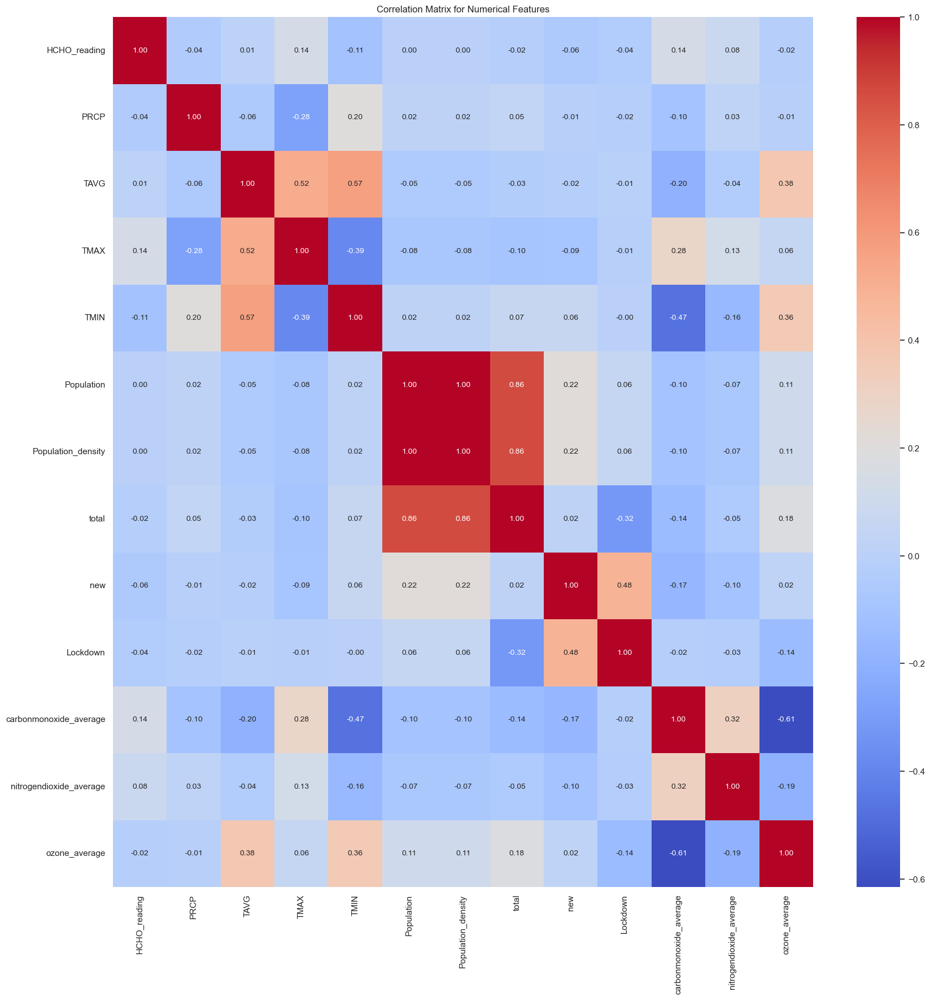

In [91]:
# Calculate the correlation matrix
correlation_matrix = df.corr(numeric_only =True)

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 10})
plt.title('Correlation Matrix for Numerical Features')
plt.show()

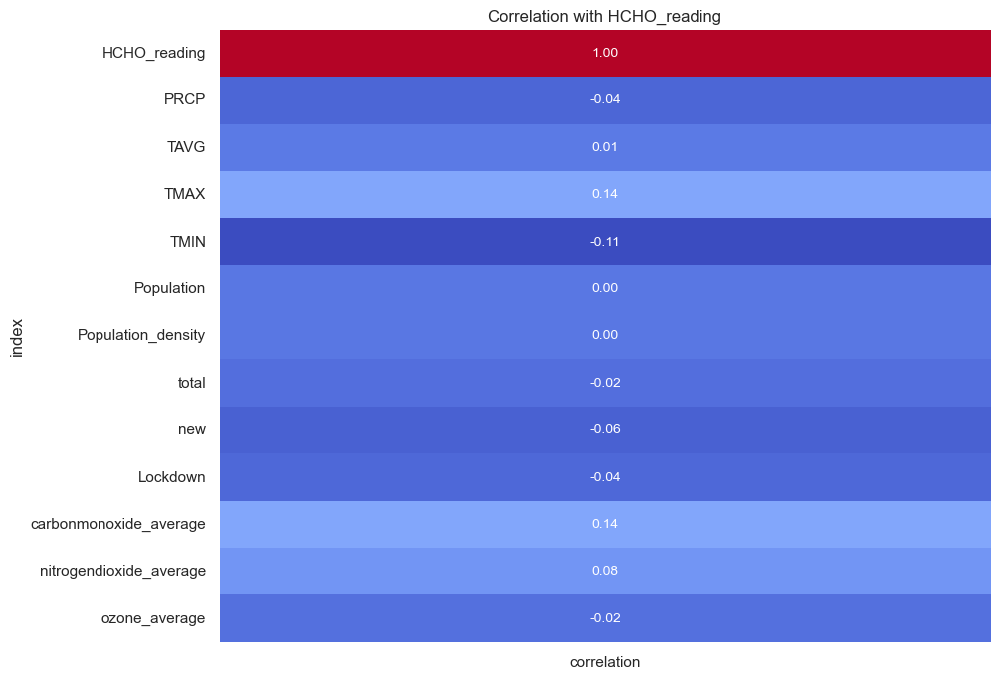

In [92]:
# Select only the correlation of numerical features with 'HCHO_reading'
correlation_with_target = correlation_matrix[['HCHO_reading']].reset_index().rename(columns={'HCHO_reading': 'correlation'})

# Plot the correlation with target as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_with_target.set_index('index'), cmap='coolwarm', annot=True, fmt=".2f", annot_kws={"size": 10}, cbar=False)
plt.title('Correlation with HCHO_reading')
plt.show()

In [93]:
df.columns

Index(['Current_Date', 'Next_Date', 'HCHO_reading', 'PRCP', 'TAVG', 'TMAX',
       'TMIN', 'Population', 'Population_density', 'total', 'new', 'Lockdown',
       'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average'],
      dtype='object')

C:\Users\janak\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


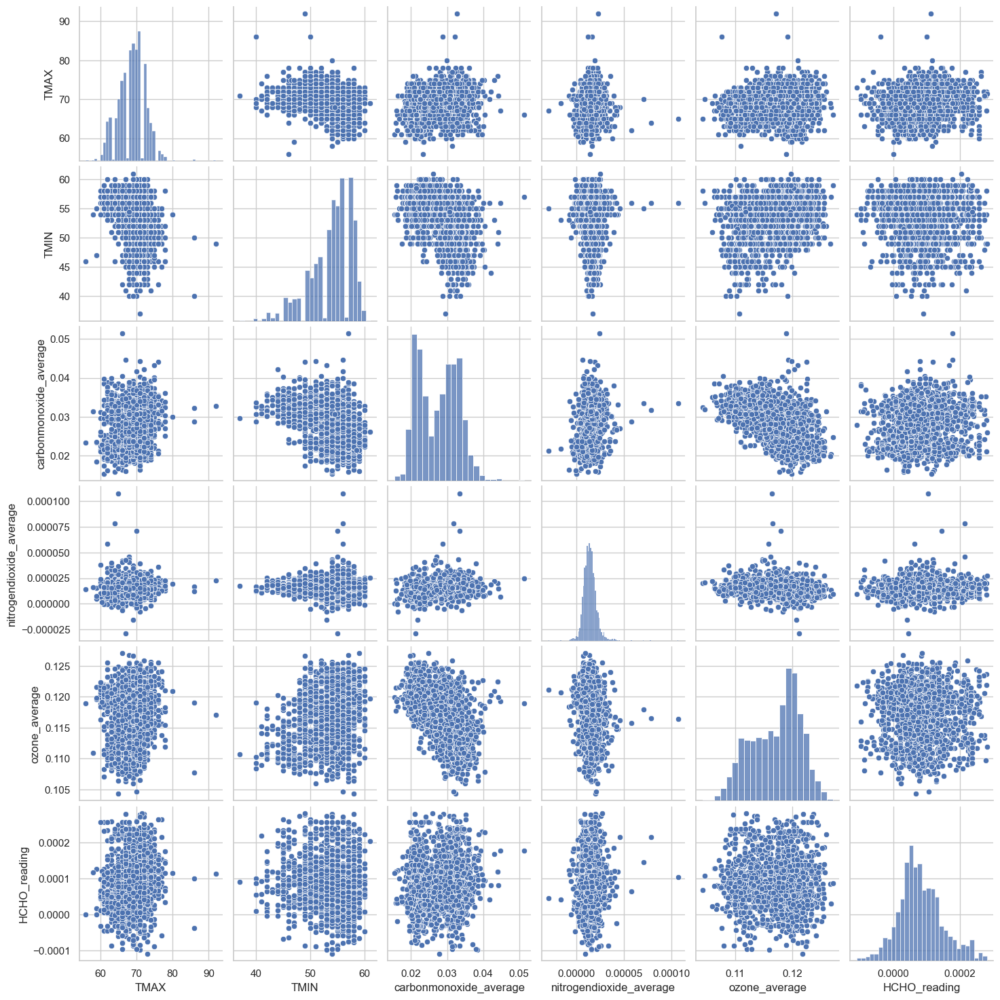

In [94]:
# Select numerical columns for pairplot
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average', 'HCHO_reading']

# Create pairplot
sns.pairplot(df[numerical_columns])
plt.show()

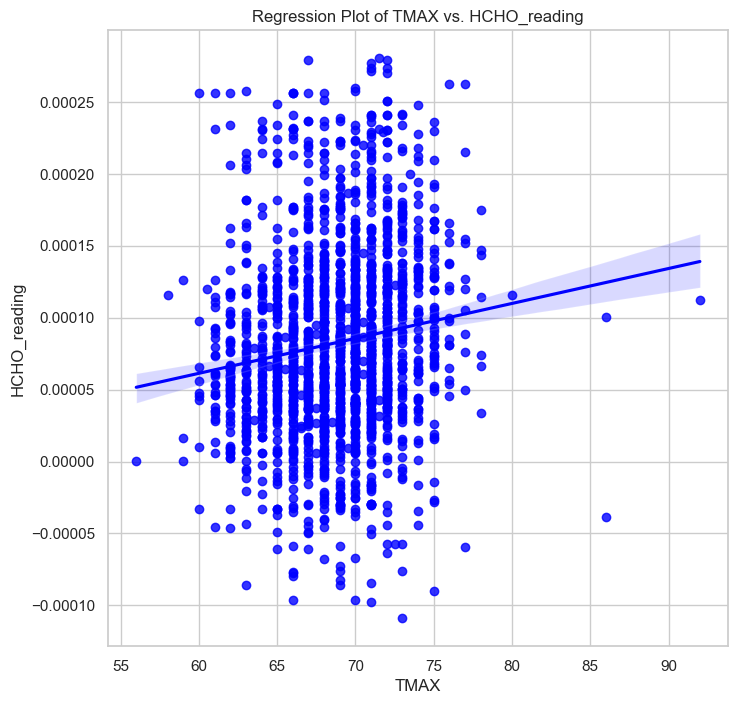

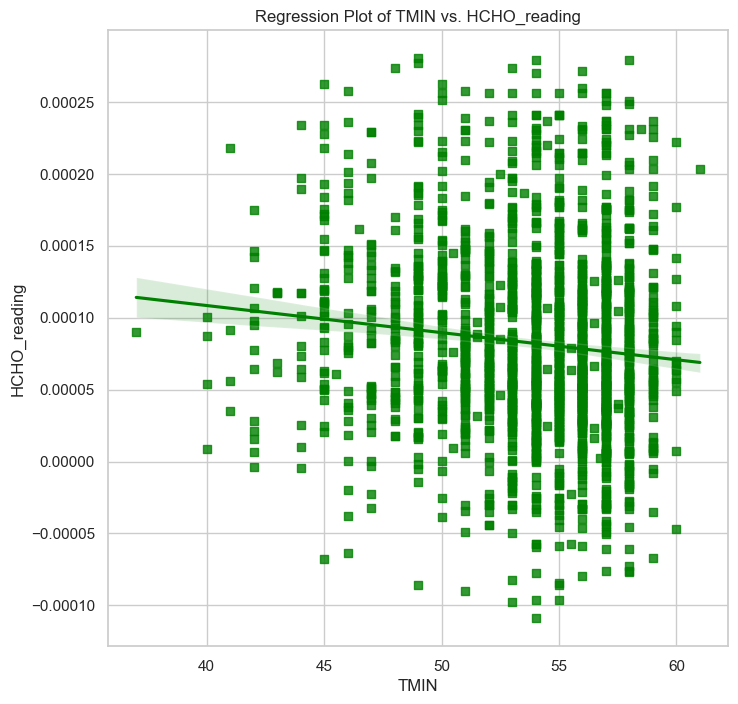

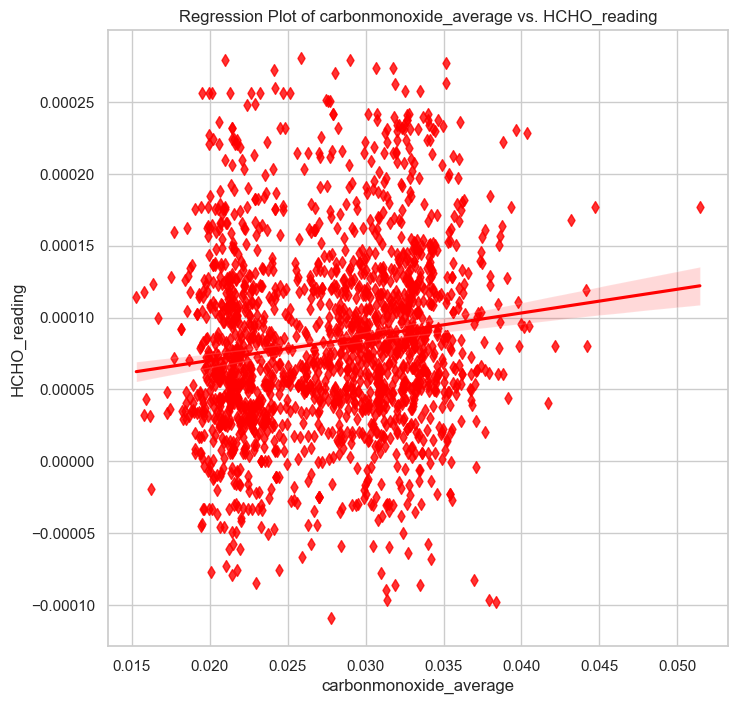

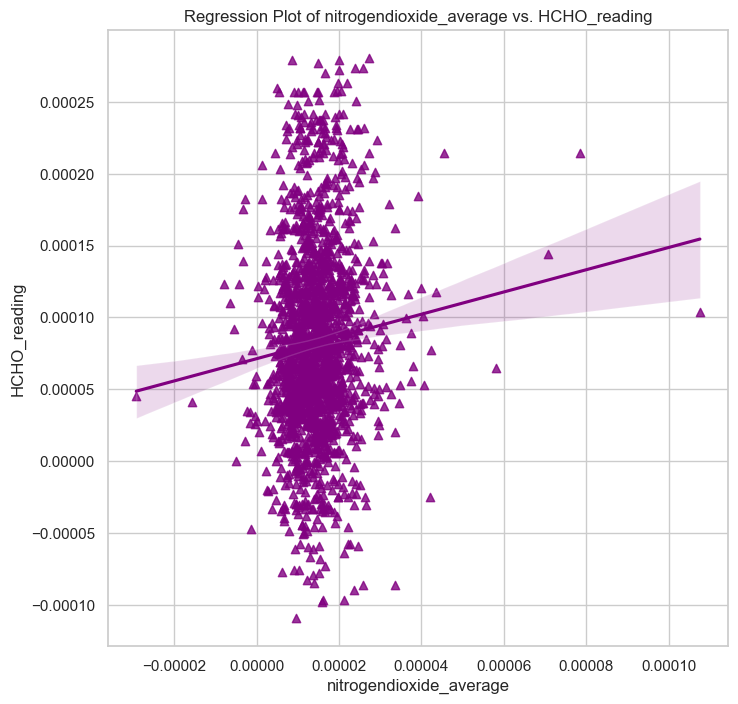

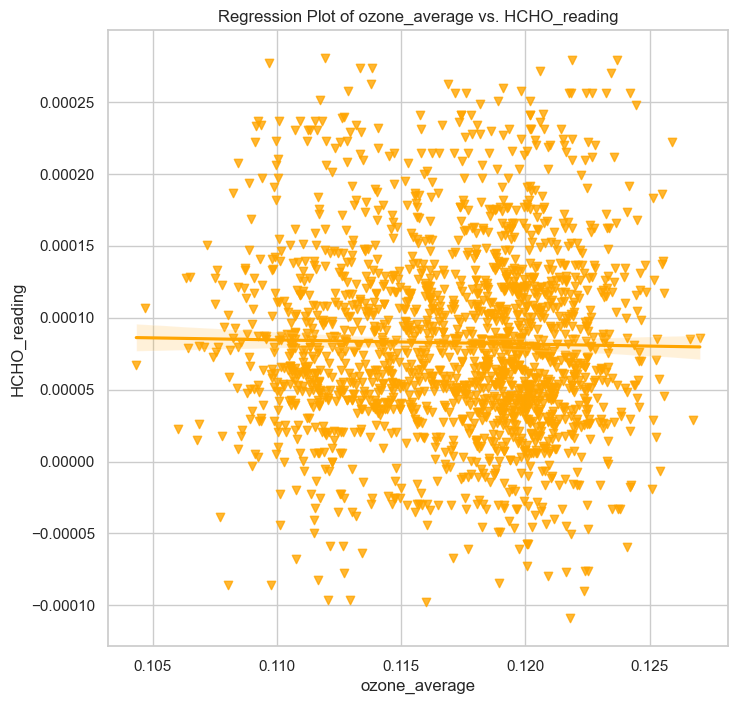

In [95]:
numerical_columns = ['TMAX', 'TMIN', 'carbonmonoxide_average', 'nitrogendioxide_average', 'ozone_average']
colors = ['blue', 'green', 'red', 'purple', 'orange']

# List of markers for regression plots
markers = ['o', 's', 'd', '^', 'v']

# Create regression plots with custom colors and markers
for i, column in enumerate(numerical_columns):
    plt.figure(figsize=(8, 8))
    sns.regplot(x=column, y='HCHO_reading', data=df, color=colors[i], marker=markers[i])
    plt.title(f'Regression Plot of {column} vs. HCHO_reading')
    plt.xlabel(column)
    plt.ylabel('HCHO_reading')
    plt.grid(True)
    plt.show()